## Find Pattern
#### Pseudocode
```python
        if (19년 데이터 + 20년 1월) 전부 존재:
            (19년 데이터 + 20년 1월)만 가지고 std를 계산
            if std > 0.3: # error_group
                if p < 0.5:  ## 변동성이 적다.
                     cov_ratio = (20Y03M/20Y02M) / (19Y03M/19Y02M)

                    if 변화가 선형적이다: .........1)
                        예측7월 <- 올해4월 * cov_ratio
                        올해4월 <- 올해 3월 * cov_ratio

                    else 변화가 비선형적이다:
                        if 계절성을 갖는다.: .........2)
                            # 다항회귀 모델 예측후 rmse 가 0.25보다 작고, diff_per가 25%미만일 경우
                            예측7월 <- 작년 7월 * cov_ratio
                            예측4월 <- 작년 4월 * cov_ratio

                        elif 특별한 규칙이 없다-> 아니 있다: .........3)
                        # 다항회귀 모델 예측후 rmse 가 0.25보다 크거나 같고, diff_per가 25% 이상일 경우
                            if 여름 피크 ?: ........new group)
                                #7,8월의 평균이 전체 평균보다 일정 기준 이상 높은 경우.....보류
                            else 진짜 규칙 x: ........new group)
                                cov_ratio = (20Y03M + 20Y02M) / (19Y03M + 19Y02M)
                                # 특별한 규칙이 없는 경우는 19년 2,3월과
                                # 20년 2,3월의 스케일만을 비교하는 것이 더 효율적이다.
                                예측7월 <- 전체 평균을 사용 * cov_ratio
                                예측4월 <- 전체 평균을 사용 * cov_ratio

                elif p >= 0.5:  ## 변동성이 크다.
                    cov_ratio = (20Y03M/20Y02M) / (19Y03M/19Y02M)

                    if 변화가 선형적이다: .........4)
                        예측7월 <- 올해4월  * cov_ratio

                    else 변화가 비선형적이다:
                        if 계절성을 갖는다.: .........5)
                            # (다항회귀 모델 예측후 rmse 가 0.45보다 작다) and (diff_per가 30%미만이다)
                            예측7월 <- 작년 6월 ~ 8월 평균* cov_ratio
                            예측4월 <- 작년 2월 ~ 3월 평균* cov_ratio

                        elif 특별한 규칙이 없다: .........6)
                            # (다항회귀 모델 예측후 rmse 가 0.45보다 크다) or (diff_per가 30% 이상이다)
                            예측7월 <- 전체 평균을 사용* cov_ratio
                            예측4월 <- 전체 평균을 사용* cov_ratio
            else std <= 0.3:
                전체 평균 * cov_ratio .........7)
                
        else 19년 데이터가 전부 존재하지 않는다: # uncomplete_group
```

## Library import

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import gc
import numpy as np
from matplotlib import font_manager, rc
from tqdm import tqdm
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
rc('font', family=font_name)

path = '../data/'
data = pd.read_csv(path +'201901-202003.csv')
new_data = pd.read_csv(path + '202004.csv')
gc.collect()
data = pd.concat([data, new_data], axis = 0)

In [2]:
#----------------------------------------------
## <group_city_clss_time>
# 데이터를 날짜, 도시, 업종으로 groupby
# 인덱싱을 편하게 하기 위해 row를 CARD_SIDO_NM,	STD_CLSS_NM, REG_YYMM 3개의 level로 표현
group_city_clss_time = data.loc[:, ['REG_YYMM', 'CARD_SIDO_NM', 'STD_CLSS_NM', 'AMT']]\
                           .groupby(['CARD_SIDO_NM', 'STD_CLSS_NM', 'REG_YYMM'])['AMT']\
                           .sum()
group_city_clss_time = pd.DataFrame(group_city_clss_time)
gc.collect()
#group_data는 'AMT'하나만 column으로 갖는다.
#group_city_clss_time = np.log(group_city_clss_time)
#print('group_city_clss_time')
#display(group_city_clss_time)
#----------------------------------------------
## <group_data>
group_data = np.log(group_city_clss_time)
#print('group_data')
#display(group_data)
#----------------------------------------------
## <group_city_clss_time_count>
group_city_clss_time_count = data.loc[:, ['REG_YYMM', 'CARD_SIDO_NM', 'STD_CLSS_NM', 'AMT']]\
                           .groupby(['CARD_SIDO_NM', 'STD_CLSS_NM', 'REG_YYMM'])['AMT']\
                           .count()
group_city_clss_time_count = pd.DataFrame(group_city_clss_time_count)
group_city_clss_time_count.columns = ['COUNT']
#print('group_city_clss_time_count')
#display(group_city_clss_time_count)
#----------------------------------------------
## <group_city_clss>
data['sido_clss_rows_under'] = (data.CSTMR_CNT <= 3) * 1
group_city_clss = pd.DataFrame(data.loc[:, ['CARD_SIDO_NM', 'STD_CLSS_NM', 'sido_clss_rows_under']].\
                               groupby(['CARD_SIDO_NM', 'STD_CLSS_NM'])[['sido_clss_rows_under']].sum())
group_city_clss['total_rows'] = data.loc[:, ['CARD_SIDO_NM', 'STD_CLSS_NM', 'sido_clss_rows_under']].\
                               groupby(['CARD_SIDO_NM', 'STD_CLSS_NM'])[['sido_clss_rows_under']].count()
group_city_clss['p'] = group_city_clss.sido_clss_rows_under / group_city_clss.total_rows
group_city_clss['std_error'] = -1.
group_city_clss['diff_per'] = -1.
group_city_clss['rmse'] = -1.
group_city_clss['r2_rate'] = -1.
group_city_clss

#print('group_city_clss')
#display(group_city_clss)
gc.collect()

13

### Make Plot Function

In [3]:
def cal_std_p(group_city_clss, std_th):
    days = group_data.reset_index()['REG_YYMM'].unique().astype('str') # REG_YYMM를 string으로 변환
    citys = data.CARD_SIDO_NM.unique() # citys : 지역(시도)의 이름들을 list로 저장
    error_group = [] # std가 0.3이상인 그룹 저장
    uncomplete_group = [] # 모든 월별 데이터가 없는 그룹 저장

    for city in tqdm(citys):
        clsses = data[data.CARD_SIDO_NM == city].STD_CLSS_NM.unique()
        # 특정지역에서는 업종이 없는 경우도 있음.
        # 지역별로 업종 list를 새로 생성
        for clss in clsses:
            y = group_data.loc[city, clss,:].values.reshape(-1)
            if len(y) == len(days):
                x = np.arange(12).reshape(-1,1)
                y_pred = np.zeros(12)
                y_pred[:] = y[:12].mean()
                std = y[:12].std()
                group_city_clss.loc[(city, clss),'std_error'] = std
                if std_th < std:
                    error_group.append((city, clss))
                else: 
                    pass
            else:
                uncomplete_group.append((city, clss))
                group_city_clss.loc[(city, clss),'std_error'] = -1
    #del group_data
    gc.collect()
    group_city_clss
    return error_group, uncomplete_group, group_city_clss

def plot_groups_by_month(group_list, log = True, figsize = (15,30), cov_7 =False):
    plt.figure(figsize = figsize)
    for index in range(len(group_list)):
        all_month = ['201901', '201902', '201903', '201904', '201905', '201906', '201907',
                 '201908', '201909', '201910', '201911', '201912', '202001', '202002', '202003', '202004']
        new_y = {}
        city, clss = group_list[index]
        
        for month in all_month:
            if month in list(map(str, group_city_clss_time.loc[city, clss].index)):
                new_y[month] = int(group_city_clss_time.loc[city, clss, int(month)])
            else:
                new_y[month] = 0
                
        #new_y = np.exp(list(new_y.values()))
        new_y = list(new_y.values())
        
        if cov_7:
            new_y = list(new_y)
            all_month.append('202007')
            new_y.append(np.exp(group_city_clss.loc[(city, clss), 202007]))
        else:
            pass
        
        if log == True:
            new_y = np.log(new_y)
        else:
            pass
        
        
        plt.plot(all_month, new_y, 'o-', label = group_list[index])
        plt.legend(bbox_to_anchor=(1.0, 1.0), fontsize = 15)
        #plt.title(group_list[index][0])
        plt.xticks(rotation = 45, fontsize = 15)
    plt.show()
    

def plot_multi_group(group_list, figsize = (10,5), log = True, cov_7 = False):
    # 10개씩 끊어서 시각화 하는 함수
    for i in range(len(group_list)//10 + 1):
        if i == len(group_list)//10:
            plot_groups_by_month(group_list[(i)*10:], figsize = figsize, log = log, cov_7 = cov_7)
        else:
            plot_groups_by_month(group_list[i*10:(i+1)*10], figsize = figsize, log = log, cov_7 = cov_7)
            
            
            
def plot_linear_reg(group_list, r2_rate, plot = True):
    group_linear = []
    group_unlinear = []
    for i in range(len(group_list)):
        city, clss = group_list[i][0], group_list[i][1]
        y = np.array(group_city_clss_time.loc[city, clss].AMT)
        y = np.log(y)
        x = np.arange(13).reshape(-1, 1)
        lin_reg = LinearRegression()
        lin_reg.fit(x, y[:13])
        y_predict = lin_reg.predict(x)
        r2 = r2_score(y[:13], y_predict)
        #**group_city_clss에 접근하여 r2를 저장**##
        group_city_clss.loc[(city, clss), 'r2_rate'] = r2
        #** ---- **#
        if r2 > r2_rate:
            group_linear.append((city, clss))
        else:
            group_unlinear.append((city, clss))
        if plot:
            if r2 > r2_rate:
                plt.plot(x, y[:13], 'o-')
                plt.plot(x, y_predict, 'o-')
                plt.show()
                print(city,' ', clss)
                print('r2 score', r2)
        else:
            pass
    #return group_linear, group_unlinear
    
def plot_poly_reg(group, plot = True):
    city, clss = group[0], group[1]
    poly_features = PolynomialFeatures(degree = 4, include_bias=False)
    y = np.array(group_city_clss_time.loc[city, clss].AMT)
    y = np.log(y)
    x = np.arange(13)
    x_poly = poly_features.fit_transform(x.reshape(-1,1))
    lin_reg = LinearRegression()
    lin_reg.fit(x_poly,  y[:13])
    y_predict = lin_reg.predict(x_poly)
    diff_min_max = max(y[:13]) - min(y[:13])
    diff_start_end = abs(y_predict[0] - y_predict[-1])
    diff_per = diff_start_end / diff_min_max * 100
    rmse = np.sqrt(np.mean((y_predict - y[:13])**2))
    if plot:
        plt.plot(x, y[:13], 'o-')
        plt.plot(x, y_predict, 'o-')
        plt.show()
        print(city,' ', clss)
        print(diff_per, '%')
        print(rmse)
    else:
        pass
    #print(diff_min_max)
    #print(diff_start_end)

    return diff_per, rmse

def find_diff_rmse(group_list, plot = True):
    diff_per_list  = []
    rmse_list = []
    for i in range(len(group_list)):
        diff_per, rmse = plot_poly_reg(group_list[i], plot = plot)
        group_city_clss.loc[group_list[i], 'diff_per'] = diff_per
        group_city_clss.loc[group_list[i], 'rmse'] = rmse
        diff_per_list.append(diff_per)
        rmse_list.append(rmse)
    return diff_per_list, rmse_list

def plot_diff_rmse(diff_per_list, rmse_list, x1 = 25, x2 = 0.25):
    plt.figure(figsize = (10,5))
    plt.subplot(1,2,1)
    sns.distplot(diff_per_list, bins = 15)
    plt.xlabel('diff_per')
    plt.axvline(x1, c = 'red')

    plt.subplot(1,2,2)
    sns.distplot(rmse_list, bins = 15)
    plt.xlabel('rmse')
    plt.axvline(x2, c = 'red')

    plt.show()
    
def split_group(std_th, p_th, r2_rate_th_1, r2_rate_th_2, diff_th_1, diff_th_2, rmse_th_1, rmse_th_2):
    group_dic = {}
    # set index  std_over_0p3, p_under_0p5
    std_over_0p3 = group_city_clss.std_error > std_th
    p_under_0p5 = group_city_clss.p < p_th
    r2_over_th = group_city_clss.r2_rate > r2_rate_th_1
    diff_under_th = group_city_clss.diff_per < diff_th_1
    rmse_under_th = group_city_clss.rmse < rmse_th_1
    
    # 1) 
    group_dic[1] = group_city_clss.loc[std_over_0p3 & p_under_0p5 & \
                                  r2_over_th].index

    # 2)
    group_dic[2] = group_city_clss.loc[std_over_0p3 & p_under_0p5 & \
                                  ((r2_over_th - 1)*(-1)) & \
                                  diff_under_th & rmse_under_th].index

    # 3)
    group_dic[3] = group_city_clss.loc[std_over_0p3 & p_under_0p5 &\
                                       ((r2_over_th - 1)*(-1)) &\
             (((diff_under_th - 1)*(-1)) | ((rmse_under_th - 1)*(-1)))].index

    # set index std_over_0p3, p_over_0p5
    p_over_0p5 = group_city_clss.p >= p_th
    r2_over_th = group_city_clss.r2_rate > r2_rate_th_2
    diff_under_th = group_city_clss.diff_per < diff_th_2
    rmse_under_th = group_city_clss.rmse < rmse_th_2


    # 4)
    group_dic[4] = group_city_clss.loc[std_over_0p3 & p_over_0p5 &\
                                  r2_over_th].index
    # 5)
    group_dic[5] = group_city_clss.loc[std_over_0p3 & p_over_0p5 &\
                                  ((r2_over_th - 1)*(-1)) & \
                                  diff_under_th & rmse_under_th].index

    # 6)
    group_dic[6] = group_city_clss.loc[std_over_0p3 &p_over_0p5 &\
                                  ((r2_over_th - 1)*(-1)) & \
                    (((diff_under_th - 1)*(-1)) | ((rmse_under_th - 1)*(-1)))].index

    # set index std_under_0p3
    std_under_0p3 = (group_city_clss.std_error <= std_th)&\
                    (group_city_clss.std_error >= 0) 

    # 7)
    group_dic[7] = group_city_clss.loc[std_under_0p3].index

    # 8) set index uncomplete_group
    group_dic[8] = uncomplete_group
    return group_dic

# ----------여기까지는 그냥 한번만 쭈욱 실행---------------------

## group_city_clss 초기화

In [4]:
# group_city_clss 초기화
group_city_clss['std_error'] = -1.
group_city_clss['diff_per'] = -1.
group_city_clss['rmse'] = -1.
group_city_clss['r2_rate'] = -1.

### Threshold 정하기

In [5]:
#*************************
std_th = 0.15
#*************************
error_group, uncomplete_group, group_city_clss = cal_std_p(group_city_clss, std_th = std_th)
print(len(error_group))

100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:58<00:00,  3.45s/it]


231


In [6]:
#*************************
p_th = 0.5
#*************************
over_std_under_pth = list(group_city_clss.loc[((group_city_clss.p < p_th) & (group_city_clss.std_error > std_th))].index)
over_std_over_pth = list(group_city_clss.loc[((group_city_clss.p >= p_th) & (group_city_clss.std_error > std_th))].index)

In [7]:
#************************* p < p_th (변동성 작은 그룹)에서
r2_rate_th_1 = 0.5
#************************* p >= p_th (변동성 큰 그룹)에서
r2_rate_th_2 = 0.5
#*************************
plot_linear_reg(over_std_under_pth, r2_rate = r2_rate_th_1, plot = False)
plot_linear_reg(over_std_over_pth, r2_rate = r2_rate_th_2, plot = False)
under_diff_per_list, under_rmse_list = find_diff_rmse(over_std_under_pth, plot = False)
over_diff_per_list, over_rmse_list = find_diff_rmse(over_std_over_pth, plot = False)

In [8]:
#*************************p < p_th (변동성 작은 그룹)에서
diff_th_1 = 30
rmse_th_1 = 0.3
#*************************p >= p_th (변동성 큰 그룹)에서
diff_th_2 = 30
rmse_th_2 = 0.3
#*************************

## split_group by threshold

In [9]:
#************************* threshold에 의해서 그룹 나누기
group_dic = split_group(std_th, p_th, r2_rate_th_1, r2_rate_th_2, diff_th_1, diff_th_2, rmse_th_1, rmse_th_2)

In [10]:
print('group_city_clss의 길이 : ', len(group_city_clss))
print('\n')
print('그룹별 크기')
total = 0
for i in range(1, 9):
    print('gorup_', i, ' : ', len(group_dic[i]))
    total += len(group_dic[i])
print(f'총합 : {total}')
print('\n')
print('그룹별 크기의 합은 group_city_clss의 길이와 일치한다.')

group_city_clss의 길이 :  650


그룹별 크기
gorup_ 1  :  13
gorup_ 2  :  126
gorup_ 3  :  71
gorup_ 4  :  1
gorup_ 5  :  6
gorup_ 6  :  14
gorup_ 7  :  363
gorup_ 8  :  56
총합 : 650


그룹별 크기의 합은 group_city_clss의 길이와 일치한다.


### plot groups

## group_1

In [11]:
group_city_clss_time

AMT
CARD_SIDO_NM STD_CLSS_NM REG_YYMM           
강원           건강보조식품 소매업  201901    148354746
                         201902    146715871
                         201903    109439025
                         201904    106548473
                         201905    148115738
...                                      ...
충북           휴양콘도 운영업    201912    139568962
                         202001    222073112
                         202002     47085830
                         202003     12733490
                         202004      9328420

[10048 rows x 1 columns]

In [12]:
# 경기 버스 운송업은 손으로 따로 처리해 줄 것.


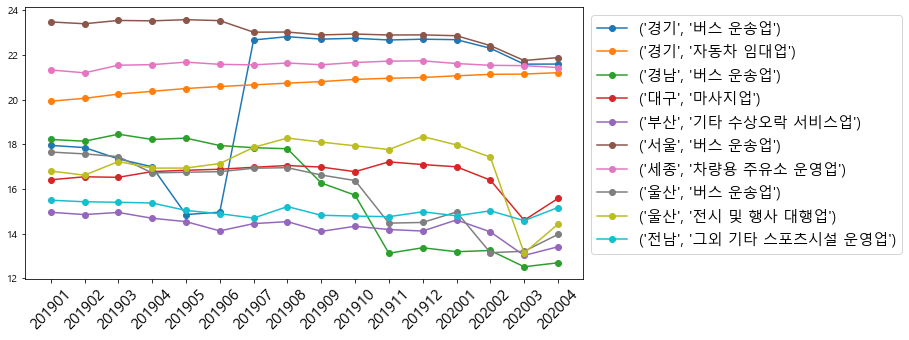

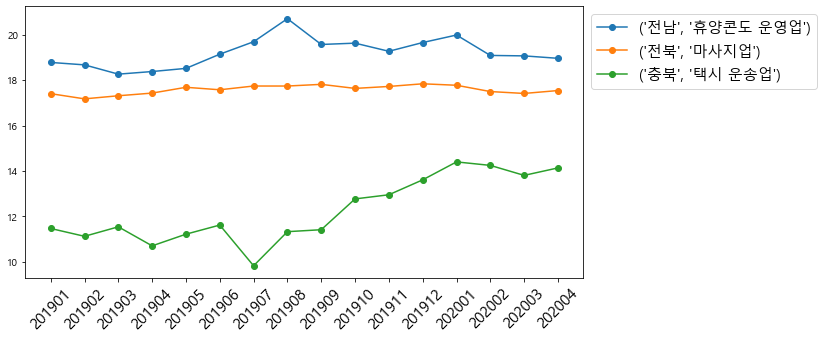

In [13]:
# 변동성이 작으면서 선형성을 갖는 그룹
# std > std_th
# p < p_th
# 선형성
plot_multi_group(group_dic[1])

## group_2

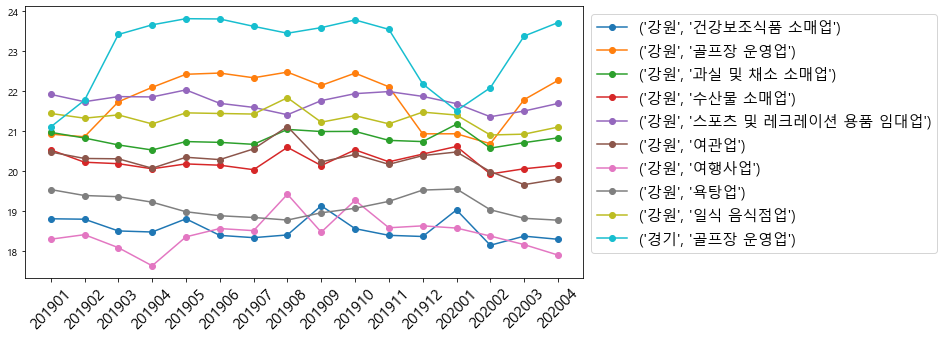

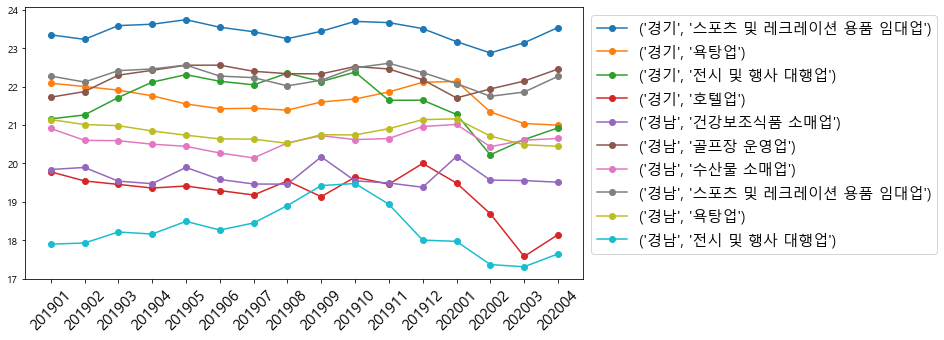

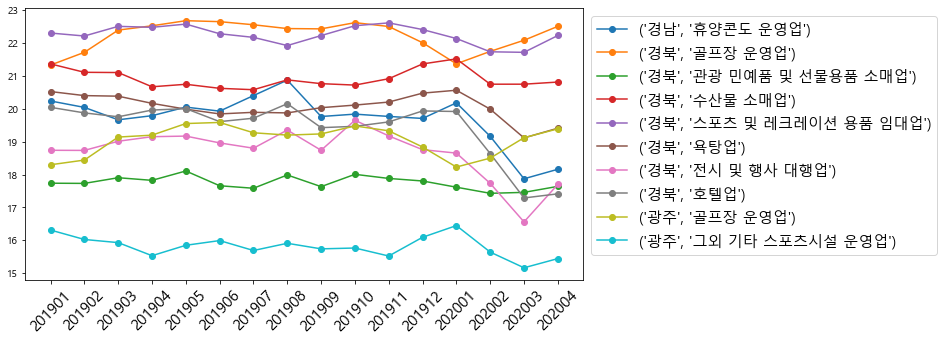

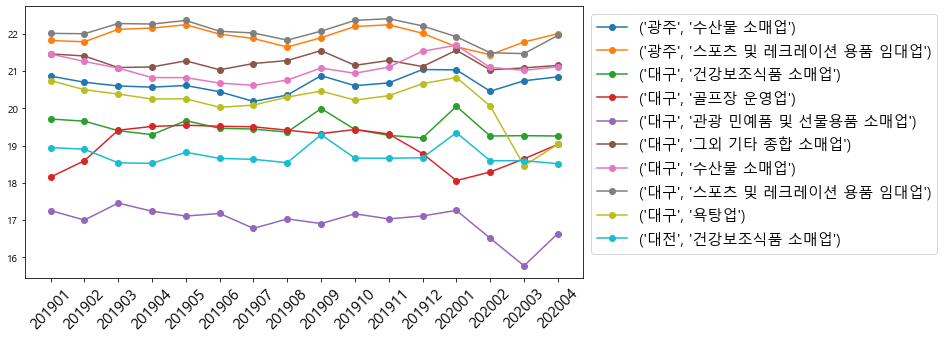

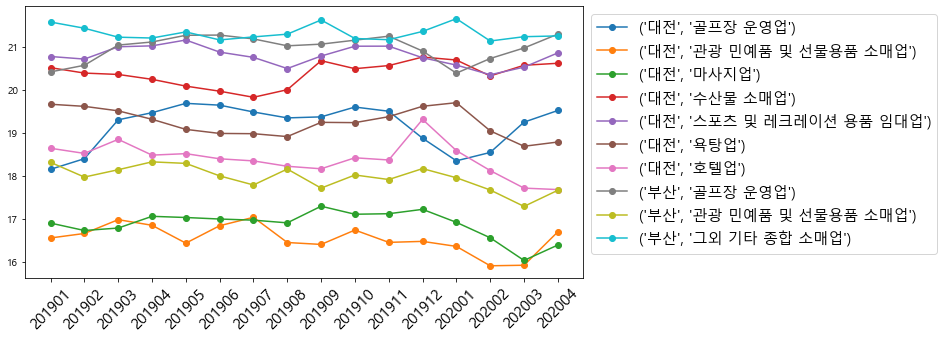

...

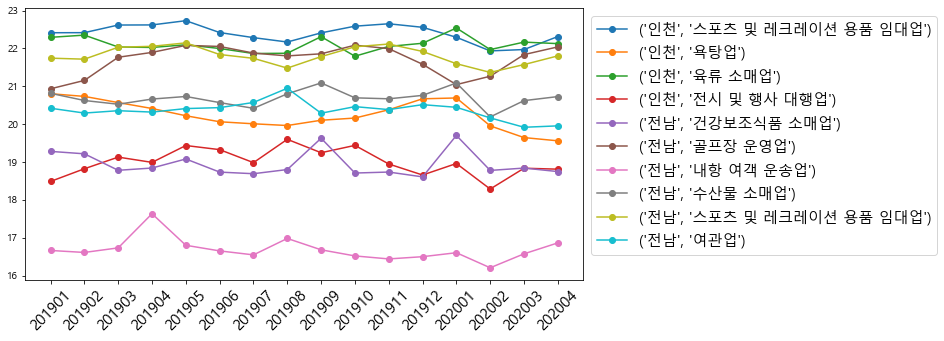

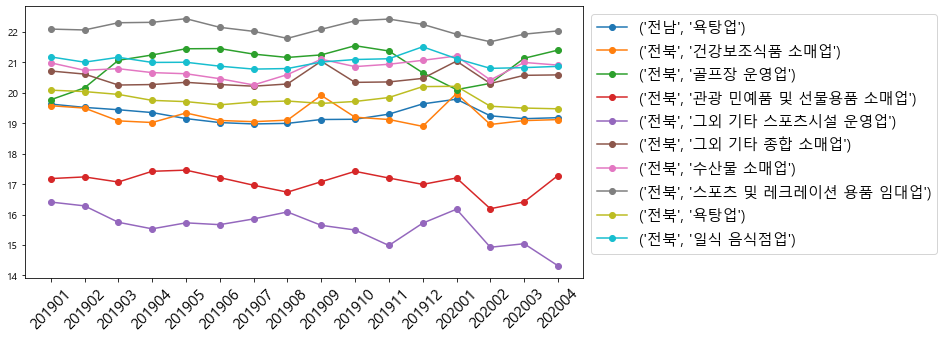

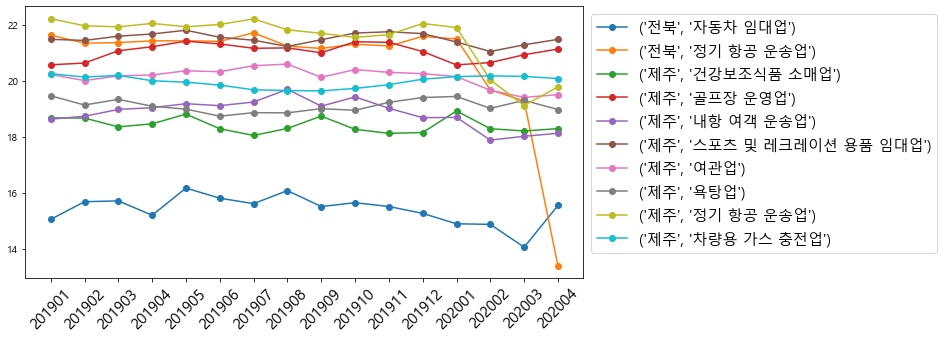

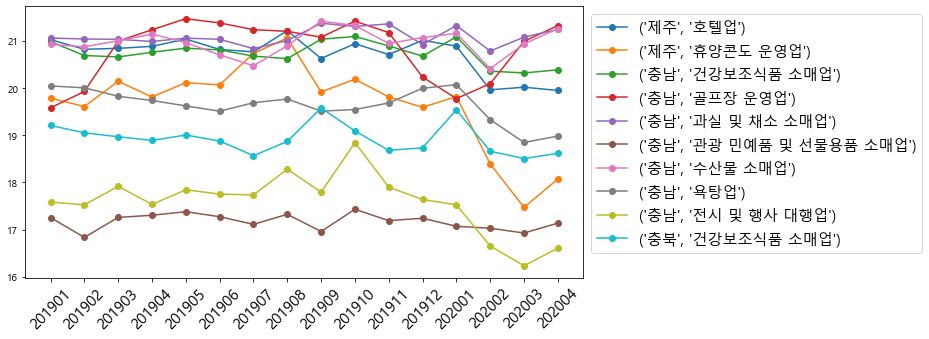

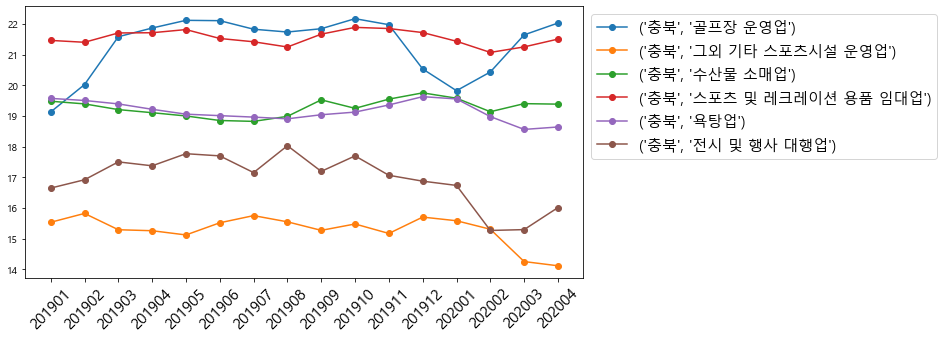

In [14]:
# 변동성이 작으면서 계절성을 갖는 그룹
# std > std_th
# p < p_th
# 계절성
plot_multi_group(group_dic[2])

## group_3

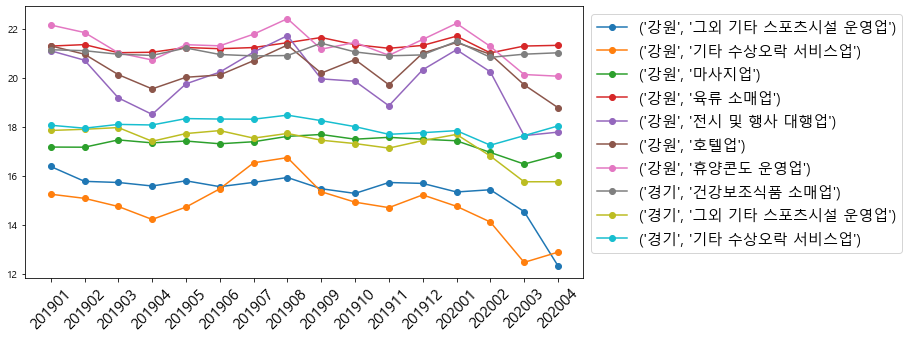

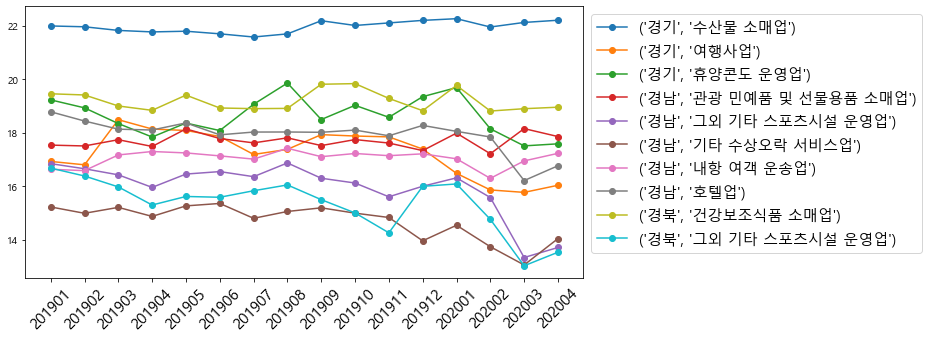

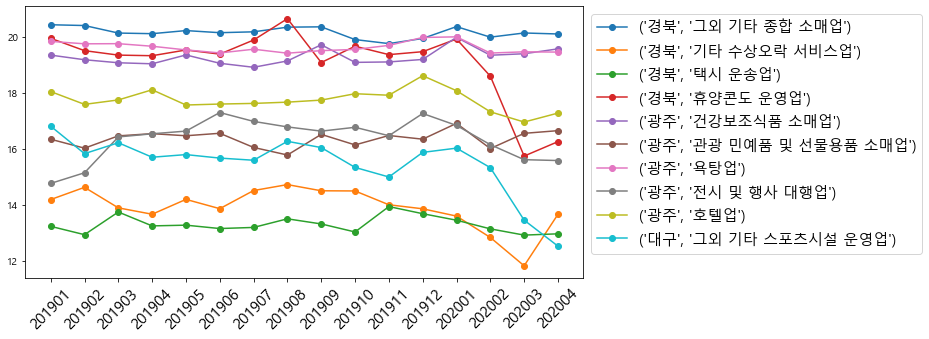

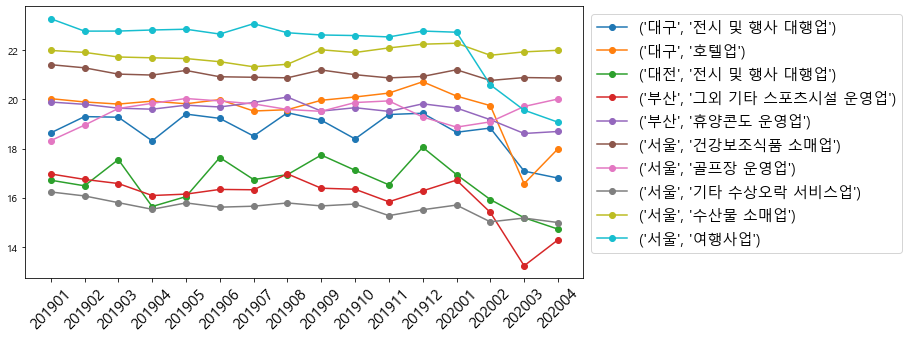

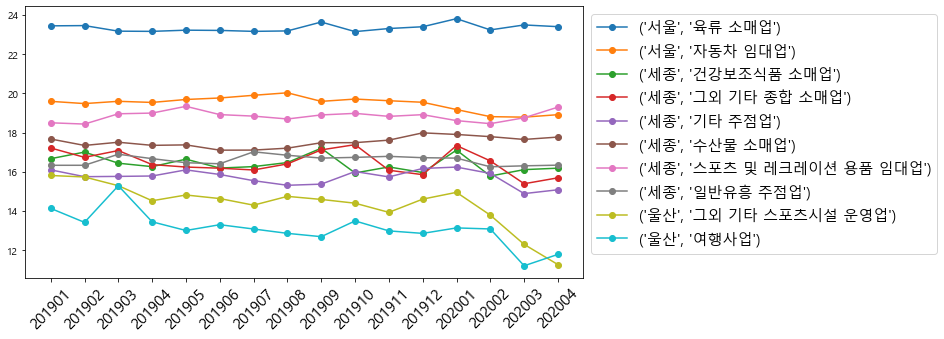

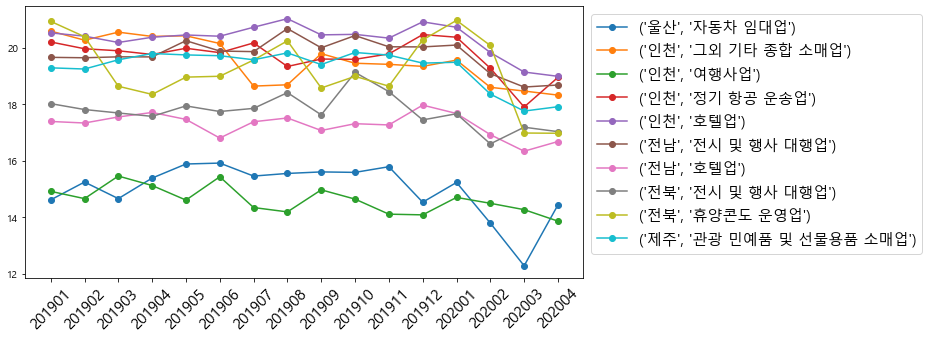

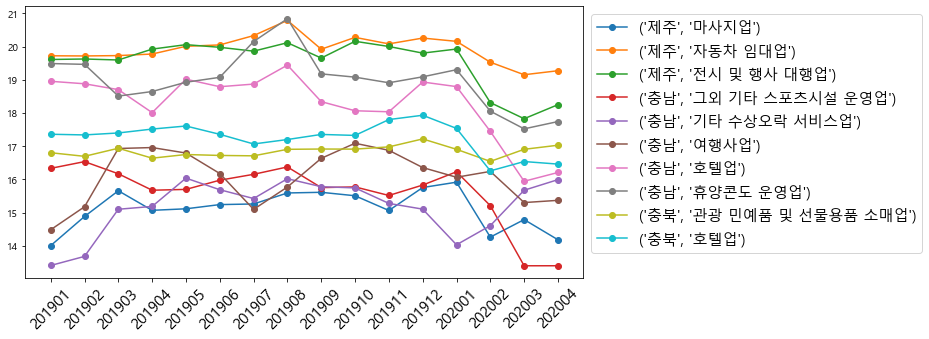

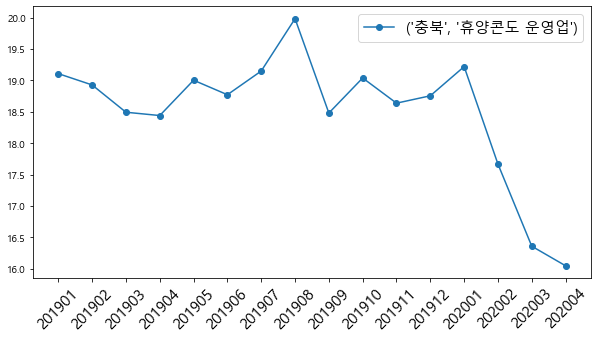

In [15]:
# 변동성이 작으면서 불규칙한 그룹
# std > std_th
# p < p_th
# 불규칙

plot_multi_group(group_dic[3])

## group_4

## std_over_0p3, p_over_0p5

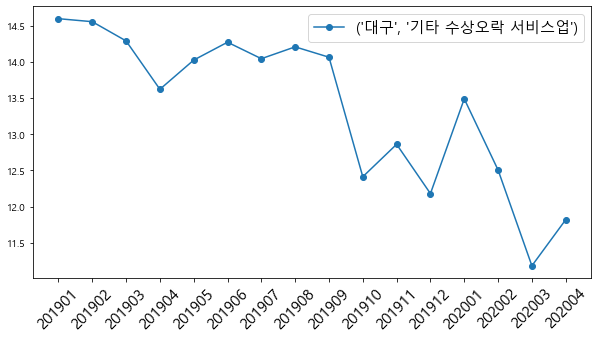

In [16]:
# 변동성이 크면서 선형성을 갖는 그룹
# std > std_th
# p >= p_th
# r2_rate > 0.5??
# 선형성
plot_multi_group(group_dic[4])

## group_5

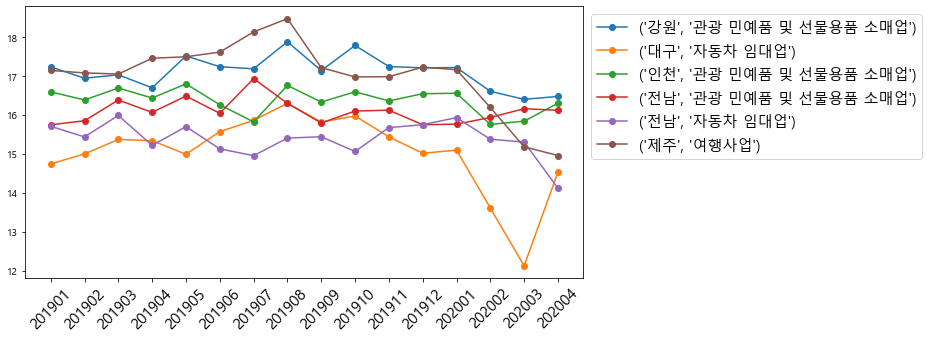

In [17]:
# 변동성이 크면서 계절성을 갖는 그룹
# std > std_th
# p >= p_th
# 계절성
plot_multi_group(group_dic[5])

## group_6

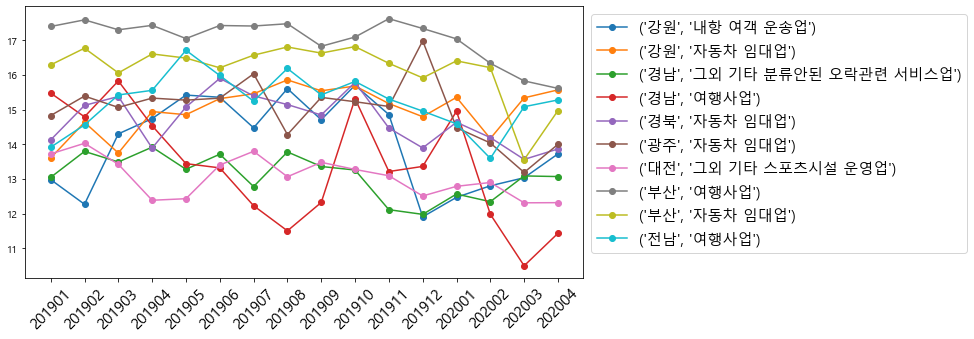

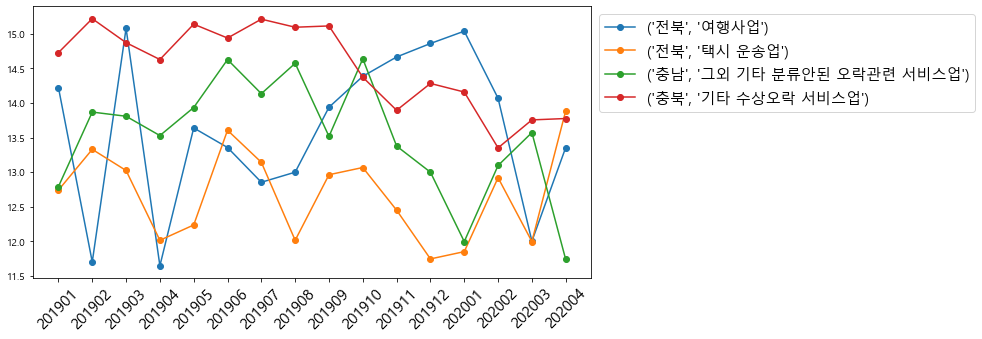

In [18]:
# 변동성이 크면서 불규칙한 그룹
# std > std_th
# p >= p_th
#불규칙
plot_multi_group(group_dic[6])

## group_7

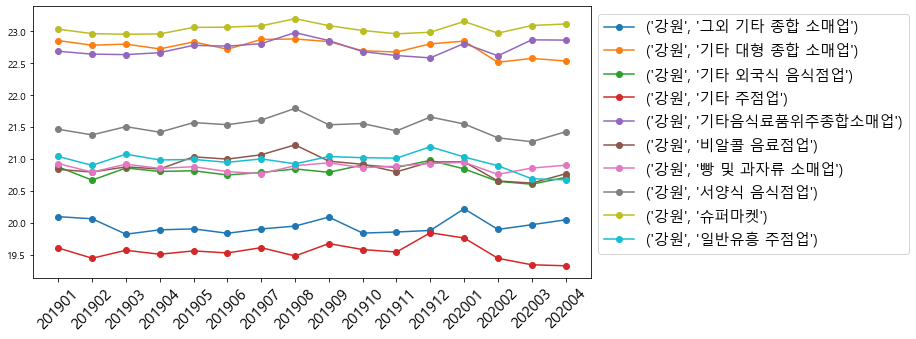

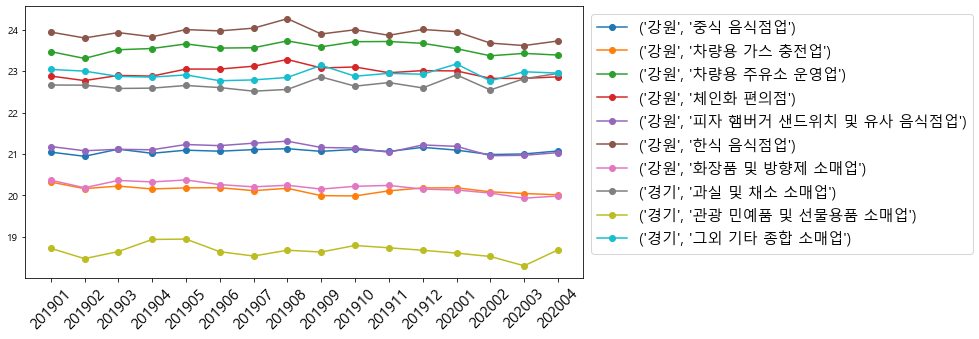

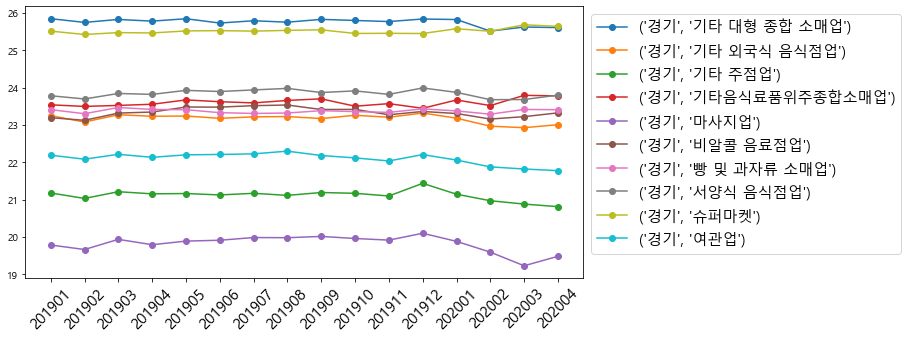

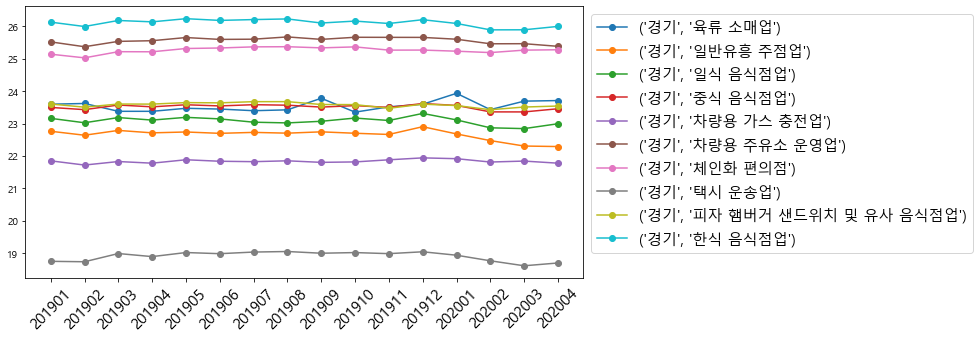

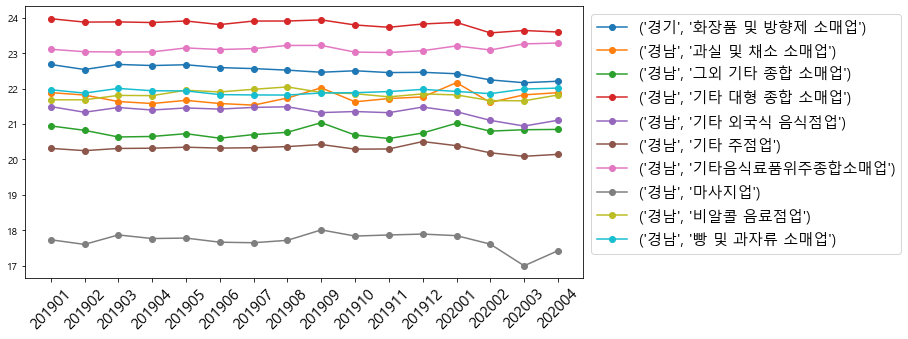

...

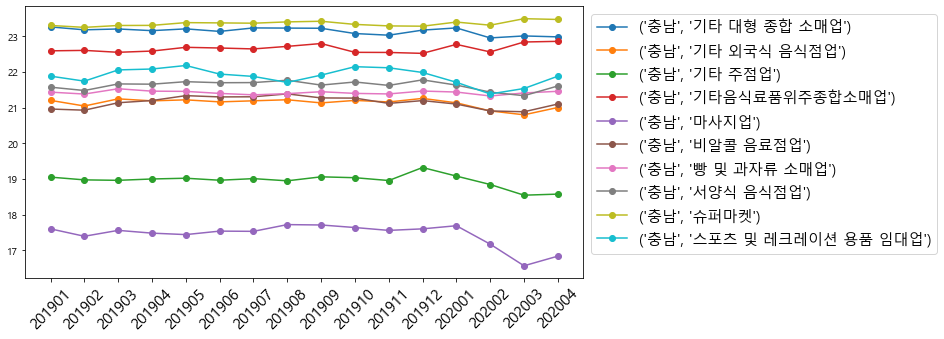

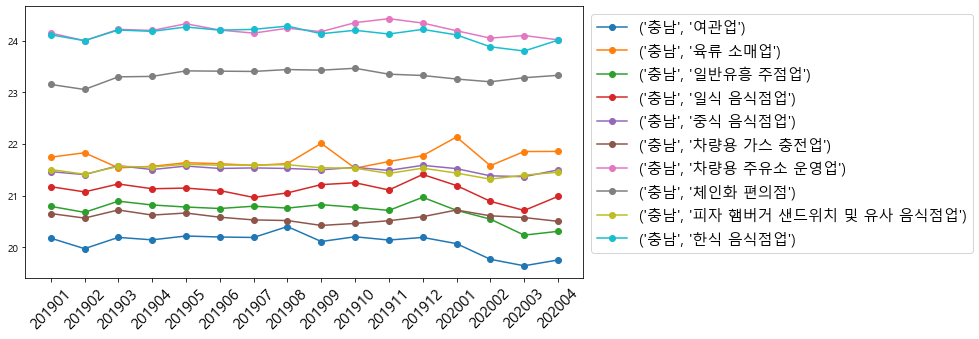

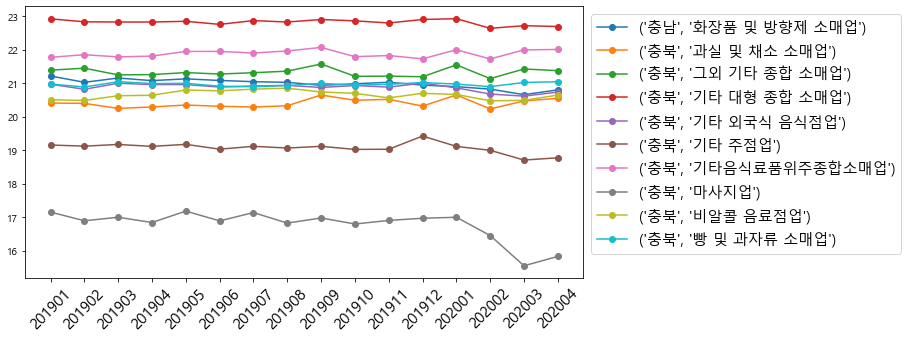

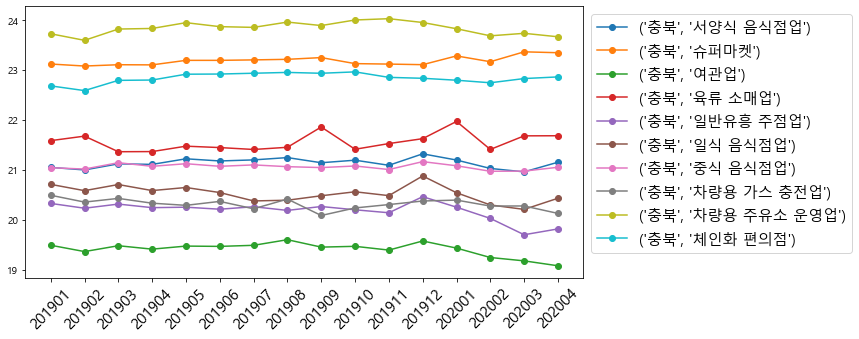

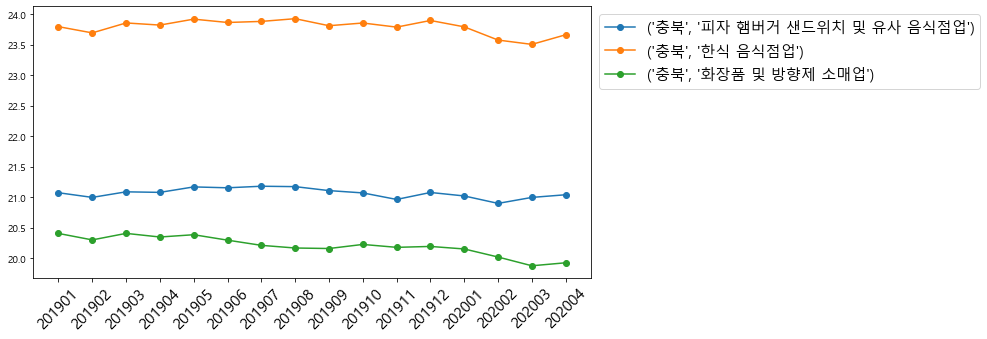

In [19]:
# 평균과 비슷한 그룹
# std <= std_th
plot_multi_group(group_dic[7])# 20개만 plot

## group_8

C:\Users\user\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:56: RuntimeWarning: divide by zero encountered in log


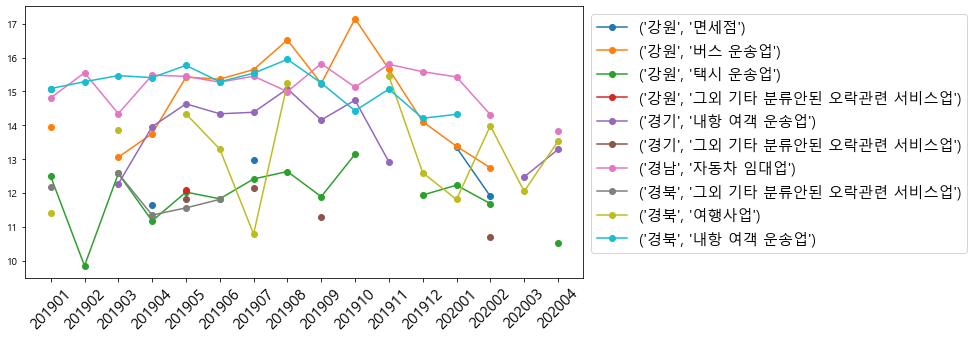

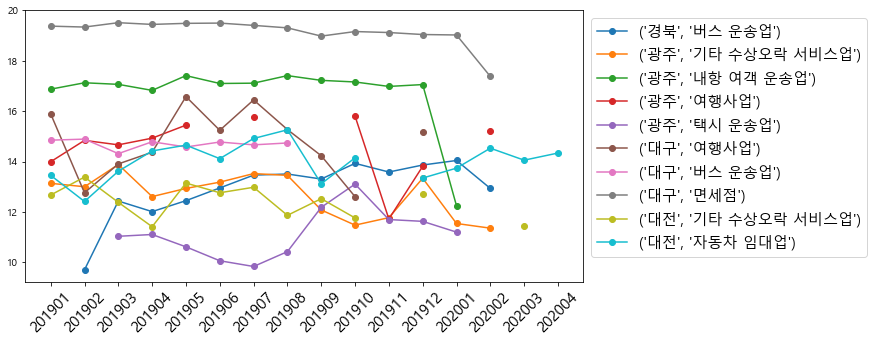

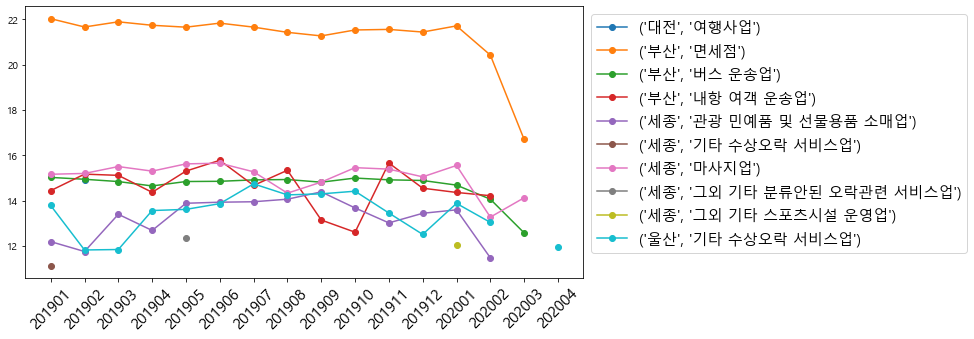

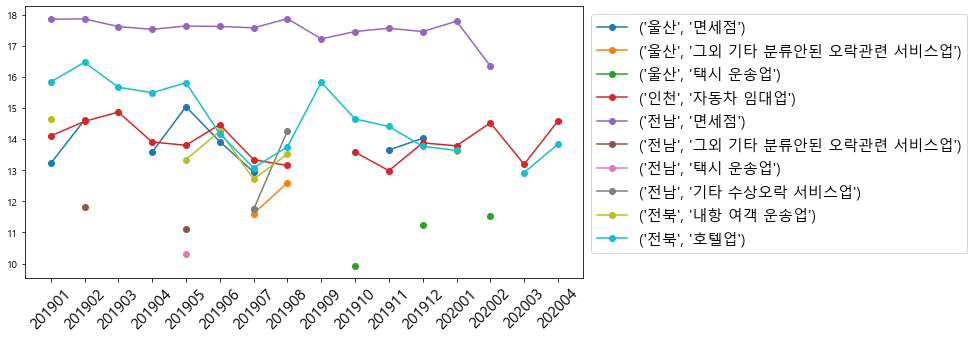

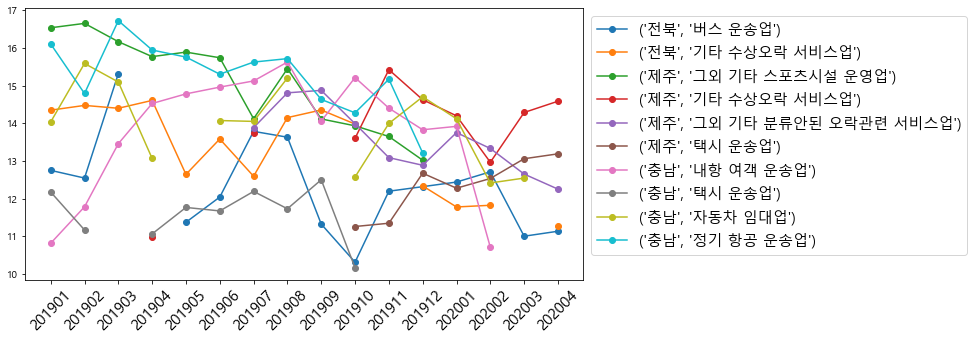

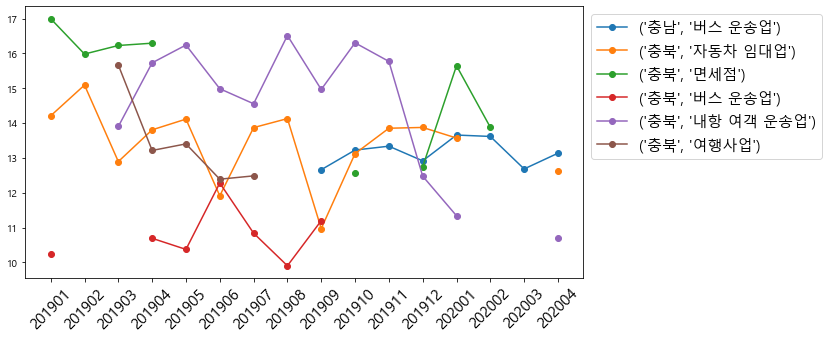

In [20]:
# 월별 데이터가 완전하지 않은 그룹
plot_multi_group(group_dic[8])

In [21]:
total

650

## Make non_cov_7month, cov_ratio

In [56]:
group_city_clss['non_cov_7'] = 0
#group_city_clss['non_cov_4'] = 0

group_city_clss['cov_ratio'] = 0
group_city_clss

sido_clss_rows_under  total_rows  \
CARD_SIDO_NM STD_CLSS_NM                                               
강원           건강보조식품 소매업                              449        1550   
             골프장 운영업                                9417       34099   
             과실 및 채소 소매업                           10402       28717   
             관광 민예품 및 선물용품 소매업                      2614        4565   
             그외 기타 분류안된 오락관련 서비스업                      2           2   
...                                                  ...         ...   
충북           피자 햄버거 샌드위치 및 유사 음식점업                 12386       37711   
             한식 음식점업                               45582      215298   
             호텔업                                     649        1335   
             화장품 및 방향제 소매업                          1482        7866   
             휴양콘도 운영업                               2494        5330   

                                           p  std_error   diff_per      rmse  \
CARD_SIDO_NM STD_CLSS_NM                                                       
강원           건강보조식품 소매업             0.289677   0.237975   2.560306  0.229872   
             골프장 운영업                0.276166   0.614788   2.577622  0.228864   
             과실 및 채소 소매업            0.362224   0.155196   4.111683  0.111664   
             관광 민예품 및 선물용품 소매업      0.572618   0.318397   3.637204  0.233183   
             그외 기타 분류안된 오락관련 서비스업   1.000000  -1.000000  -1.000000 -1.000000   
...                                      ...        ...        ...       ...   
충북           피자 햄버거 샌드위치 및 유사 음식점업  0.328445   0.065237  -1.000000 -1.000000   
             한식 음식점업                0.211716   0.062572  -1.000000 -1.000000   
             호텔업                    0.486142   0.232293  48.834009  0.144811   
             화장품 및 방향제 소매업          0.188406   0.091612  -1.000000 -1.000000   
             휴양콘도 운영업               0.467917   0.404723   3.952846  0.311591   

                                     r2_rate  non_cov_7  cov_ratio     202007  
CARD_SIDO_NM STD_CLSS_NM                                                       
강원           건강보조식품 소매업             0.000811          0          0  18.239801  
             골프장 운영업                0.006120          0          0  22.565428  
             과실 및 채소 소매업            0.157813          0          0  21.062469  
             관광 민예품 및 선물용품 소매업      0.123572          0          0  17.069491  
             그외 기타 분류안된 오락관련 서비스업  -1.000000          0          0   0.464766  
...                                      ...        ...        ...        ...  
충북           피자 햄버거 샌드위치 및 유사 음식점업 -1.000000          0          0  21.138338  
             한식 음식점업               -1.000000          0          0  23.763609  
             호텔업                    0.161403          0          0  16.516016  
             화장품 및 방향제 소매업         -1.000000          0          0  19.889524  
             휴양콘도 운영업               0.014654          0          0  17.633261  

[650 rows x 10 columns]

In [57]:
group_city_clss_time

AMT
CARD_SIDO_NM STD_CLSS_NM REG_YYMM           
강원           건강보조식품 소매업  201901    148354746
                         201902    146715871
                         201903    109439025
                         201904    106548473
                         201905    148115738
...                                      ...
충북           휴양콘도 운영업    201912    139568962
                         202001    222073112
                         202002     47085830
                         202003     12733490
                         202004      9328420

[10048 rows x 1 columns]

In [58]:
group_city_clss_time
group_city_clss_time_log = pd.DataFrame(np.log(group_city_clss_time['AMT']))

In [89]:
df_city_clss_tiem = group_city_clss_time_log.reset_index()
def make_non_cov_1(group_list, using_month):
    for city, clss in group_list:
        group = df_city_clss_tiem.loc[(df_city_clss_tiem.CARD_SIDO_NM == city)&\
                                      (df_city_clss_tiem.STD_CLSS_NM == clss)]
        month_list = list(group.REG_YYMM.values)
        AMT_sum = []
        for month in using_month:
            if month in month_list:
                AMT_sum.append(group.loc[group.REG_YYMM == month, 'AMT'].values[0])
            else:
                pass
        if AMT_sum == []:
            AMT_avg = np.mean(group.AMT)
        else:
            AMT_avg = np.mean(AMT_sum)
        group_city_clss.loc[(city, clss), 'non_cov_7'] = AMT_avg
        
def make_non_cov_2(group_list, using_month):
    for city, clss in group_list:
        group = df_city_clss_tiem.loc[(df_city_clss_tiem.CARD_SIDO_NM == city)&\
                                      (df_city_clss_tiem.STD_CLSS_NM == clss)]
        month_list = list(group.REG_YYMM.values)
        AMT_sum = []
        
        for month in using_month:
            if month in month_list:
                AMT_sum.append(group.loc[group.REG_YYMM == month,
                                         'AMT'].values[0])
            else:
                pass
            
        full_month = [201901, 201902, 201903, 201904, 201905, 201906, 201907,
                 201908, 201909, 201910, 201911, 201912, 202001]
        for month in full_month:
            AMT_sum.append(group.loc[group.REG_YYMM == month, 'AMT'].values[0])

        AMT_avg = np.mean(AMT_sum)
        group_city_clss.loc[(city, clss), 'non_cov_7'] = AMT_avg
        
def make_non_cov_3(group_list, using_month):
    for city, clss in group_list:
        group = df_city_clss_tiem.loc[(df_city_clss_tiem.CARD_SIDO_NM == city)&\
                                      (df_city_clss_tiem.STD_CLSS_NM == clss)]
        month_list = list(group.REG_YYMM.values)
        full_month = [201901, 201902, 201903, 201904, 201905, 201906, 201907,
                      201908, 201909, 201910, 201911, 201912, 202001]
        full_amt = {}
        
        size = 1
        length = []
        discount_fac = 1
        for month in reversed(full_month):
            if month in month_list:
                full_amt[month] = group.loc[group.REG_YYMM == month, 'AMT'].values[0] * discount_fac
            else:
                full_amt[month] = 0
            length.append(size)
            size = size * 0.9
            discount_fac = discount_fac * 0.9
        
        AMT_sum = np.sum(list(full_amt.values()))
        AMT_avg = AMT_sum / np.sum(length)
        group_city_clss.loc[(city, clss), 'non_cov_7'] = AMT_avg

In [90]:
def make_cov_ratio_1(group_list):
    for city, clss in group_list:
        group = df_city_clss_tiem.loc[(df_city_clss_tiem.CARD_SIDO_NM == city)&\
                                      (df_city_clss_tiem.STD_CLSS_NM == clss)]
        month_list = list(group.REG_YYMM.values)
        AMT_sum = []
        
        ratio_20_19 = group.loc[group.REG_YYMM == 202004, 'AMT'].values[0] / \
                        group.loc[group.REG_YYMM == 201904, 'AMT'].values[0]
        
        cov_ratio = (1 + 4 *ratio_20_19) / 5
        group_city_clss.loc[(city, clss), 'cov_ratio'] = cov_ratio

def make_cov_ratio_2(group_list):
    for city, clss in group_list:
        group = df_city_clss_tiem.loc[(df_city_clss_tiem.CARD_SIDO_NM == city)&\
                                      (df_city_clss_tiem.STD_CLSS_NM == clss)]
        month_list = list(group.REG_YYMM.values)
        AMT_sum = []
        
        before = []
        for month in [201903, 201904, 201902]:
            before.append(group.loc[group.REG_YYMM == month, 'AMT'].values[0])
        after = []
        for month in [202004, 202003, 202002]:
            after.append(group.loc[group.REG_YYMM == month, 'AMT'].values[0])
            
        ratio_20_19 = np.mean(after) / np.mean(before)
        cov_ratio = (1 + 4*ratio_20_19) / 5
        group_city_clss.loc[(city, clss), 'cov_ratio'] = cov_ratio

        
def make_cov_ratio_3(group_list):
    for city, clss in group_list:
        group = df_city_clss_tiem.loc[(df_city_clss_tiem.CARD_SIDO_NM == city)&\
                                      (df_city_clss_tiem.STD_CLSS_NM == clss)]
        month_list = list(group.REG_YYMM.values)
        AMT_sum = []
        for month in month_list:
            AMT_sum.append(group.loc[group.REG_YYMM == month, 'AMT'].values[0])
        avg = np.mean(AMT_sum)
        
        if 202004 in month_list:
            cov_ratio = group.loc[group.REG_YYMM == 202004, 'AMT'].values[0] / avg
        elif 202003 in month_list:
            cov_ratio = (group.loc[group.REG_YYMM == 202003, 'AMT'].values[0] / avg) * 0.7
        else:
            cov_ratio = 0.4
        
        group_city_clss.loc[(city, clss), 'cov_ratio'] = cov_ratio
        
        
def make_cov_ratio_4(group_list):
    for city, clss in group_list:
        group = df_city_clss_tiem.loc[(df_city_clss_tiem.CARD_SIDO_NM == city)&\
                                      (df_city_clss_tiem.STD_CLSS_NM == clss)]
        month_list = list(group.REG_YYMM.values)
        AMT_sum = []
        
        before = []
        for month in [201907, 201908, 201909]:
            before.append(group.loc[group.REG_YYMM == month, 'AMT'].values[0])
        after = []
        for month in [202004, 202003, 202002]:
            after.append(group.loc[group.REG_YYMM == month, 'AMT'].values[0])
            
        ratio_20_19 = np.mean(after) / np.mean(before)
        cov_ratio = (1 + 3*ratio_20_19) / 4
        group_city_clss.loc[(city, clss), 'cov_ratio'] = cov_ratio
        
        
        
        
        


In [91]:
#non_cov 7월 예측

make_non_cov_1(group_dic[1], [201911, 201912, 202001])

make_non_cov_1(group_dic[2], [201906, 201907, 201908])

make_non_cov_1(group_dic[3], [201905, 201906, 201907, 201908])

make_non_cov_1(group_dic[4], [201905, 201906, 201907, 201908])

make_non_cov_1(group_dic[5], [201905, 201906, 201907, 201908, 201909])

make_non_cov_2(group_dic[6], [201905, 201906, 201907, 201908, 201909])
#using_month는 가중치를 2배하여 평균
make_non_cov_1(group_dic[7], [201906, 201907, 201908])

make_non_cov_3(group_dic[8], [201906, 201907, 201908])
#using_month는 가중치를 2배하여 평균
# 0없는 데이터는 0으로 하여 같이 평균

In [92]:
#  cov_ratio 예측
make_cov_ratio_4(group_dic[1])
make_cov_ratio_1(group_dic[2])
make_cov_ratio_2(group_dic[3])
make_cov_ratio_4(group_dic[4])
make_cov_ratio_2(group_dic[5])
make_cov_ratio_2(group_dic[6])
make_cov_ratio_1(group_dic[7])
make_cov_ratio_3(group_dic[8])

In [93]:
group_city_clss[202007] = group_city_clss.non_cov_7 * group_city_clss.cov_ratio
group_city_clss

sido_clss_rows_under  total_rows  \
CARD_SIDO_NM STD_CLSS_NM                                               
강원           건강보조식품 소매업                              449        1550   
             골프장 운영업                                9417       34099   
             과실 및 채소 소매업                           10402       28717   
             관광 민예품 및 선물용품 소매업                      2614        4565   
             그외 기타 분류안된 오락관련 서비스업                      2           2   
...                                                  ...         ...   
충북           피자 햄버거 샌드위치 및 유사 음식점업                 12386       37711   
             한식 음식점업                               45582      215298   
             호텔업                                     649        1335   
             화장품 및 방향제 소매업                          1482        7866   
             휴양콘도 운영업                               2494        5330   

                                           p  std_error   diff_per      rmse  \
CARD_SIDO_NM STD_CLSS_NM                                                       
강원           건강보조식품 소매업             0.289677   0.237975   2.560306  0.229872   
             골프장 운영업                0.276166   0.614788   2.577622  0.228864   
             과실 및 채소 소매업            0.362224   0.155196   4.111683  0.111664   
             관광 민예품 및 선물용품 소매업      0.572618   0.318397   3.637204  0.233183   
             그외 기타 분류안된 오락관련 서비스업   1.000000  -1.000000  -1.000000 -1.000000   
...                                      ...        ...        ...       ...   
충북           피자 햄버거 샌드위치 및 유사 음식점업  0.328445   0.065237  -1.000000 -1.000000   
             한식 음식점업                0.211716   0.062572  -1.000000 -1.000000   
             호텔업                    0.486142   0.232293  48.834009  0.144811   
             화장품 및 방향제 소매업          0.188406   0.091612  -1.000000 -1.000000   
             휴양콘도 운영업               0.467917   0.404723   3.952846  0.311591   

                                     r2_rate  non_cov_7  cov_ratio     202007  
CARD_SIDO_NM STD_CLSS_NM                                                       
강원           건강보조식품 소매업             0.000811  18.384572   0.992125  18.239801  
             골프장 운영업                0.006120  22.425919   1.006221  22.565428  
             과실 및 채소 소매업            0.157813  20.816435   1.011819  21.062469  
             관광 민예품 및 선물용품 소매업      0.123572  17.395585   0.981254  17.069491  
             그외 기타 분류안된 오락관련 서비스업  -1.000000   0.697457   0.400000   0.278983  
...                                      ...        ...        ...        ...  
충북           피자 햄버거 샌드위치 및 유사 음식점업 -1.000000  21.169673   0.998520  21.138338  
             한식 음식점업               -1.000000  23.890917   0.994671  23.763609  
             호텔업                    0.161403  17.309684   0.954149  16.516016  
             화장품 및 방향제 소매업         -1.000000  20.225348   0.983396  19.889524  
             휴양콘도 운영업               0.014654  19.225607   0.917176  17.633261  

[650 rows x 10 columns]

In [94]:
group_city_clss_time

AMT
CARD_SIDO_NM STD_CLSS_NM REG_YYMM           
강원           건강보조식품 소매업  201901    148354746
                         201902    146715871
                         201903    109439025
                         201904    106548473
                         201905    148115738
...                                      ...
충북           휴양콘도 운영업    201912    139568962
                         202001    222073112
                         202002     47085830
                         202003     12733490
                         202004      9328420

[10048 rows x 1 columns]

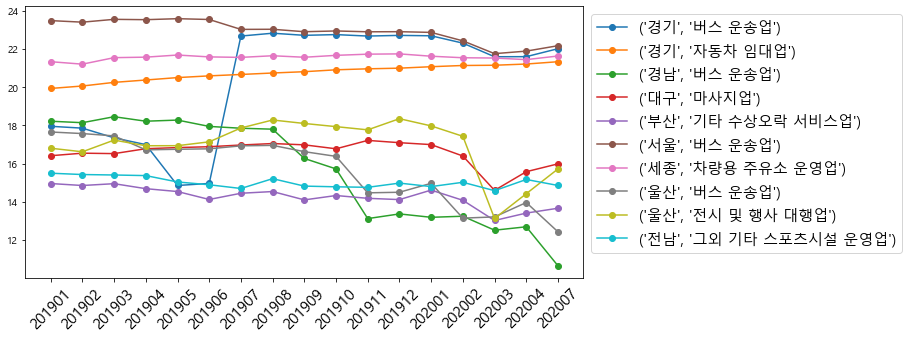

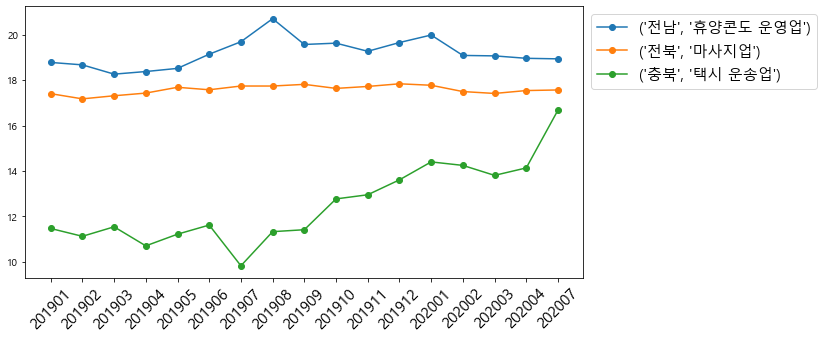

In [49]:
plot_multi_group(group_dic[1], cov_7 = True)

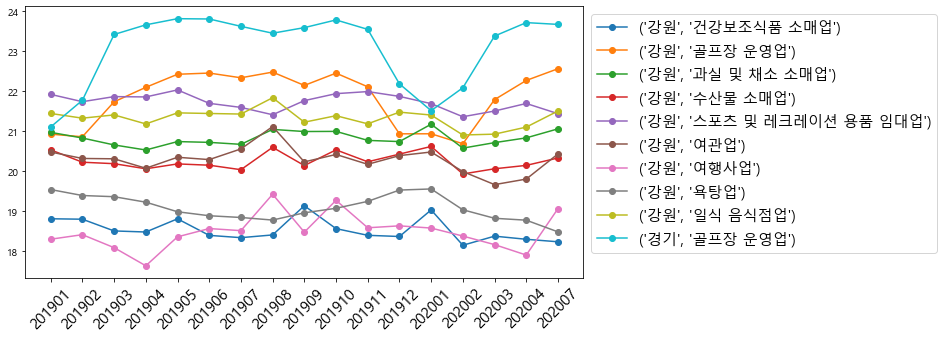

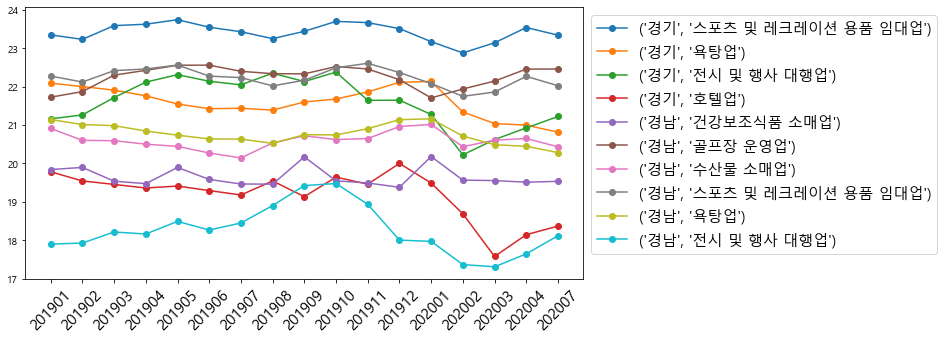

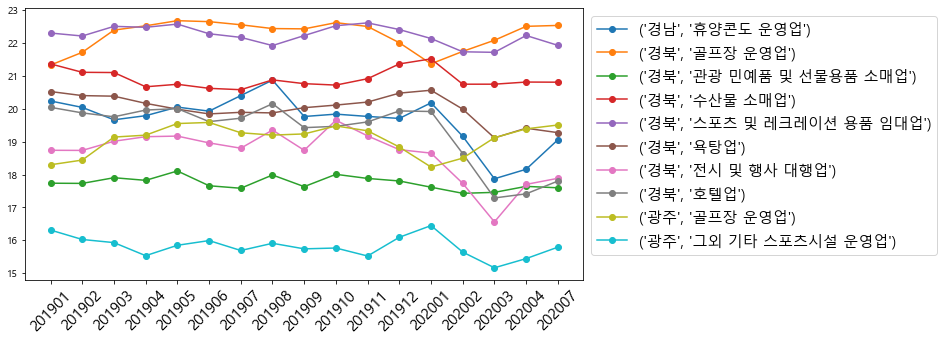

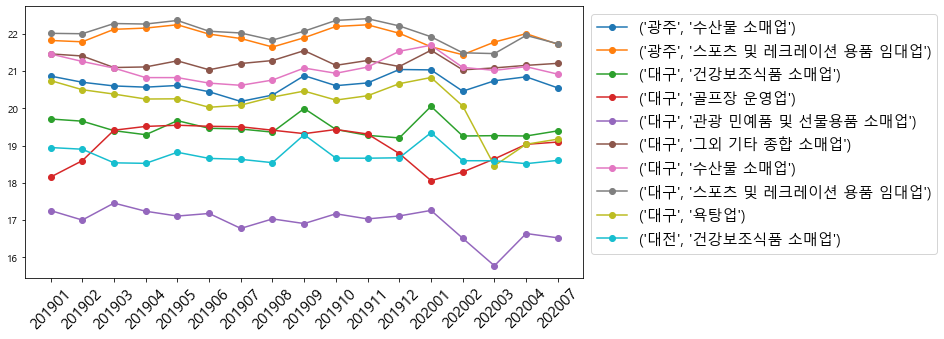

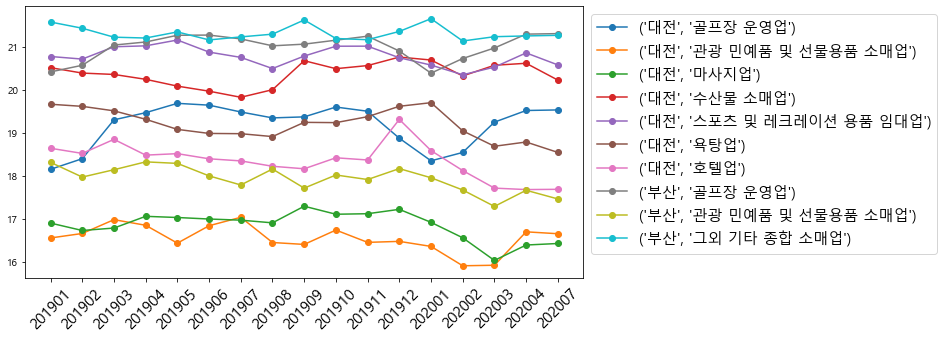

...

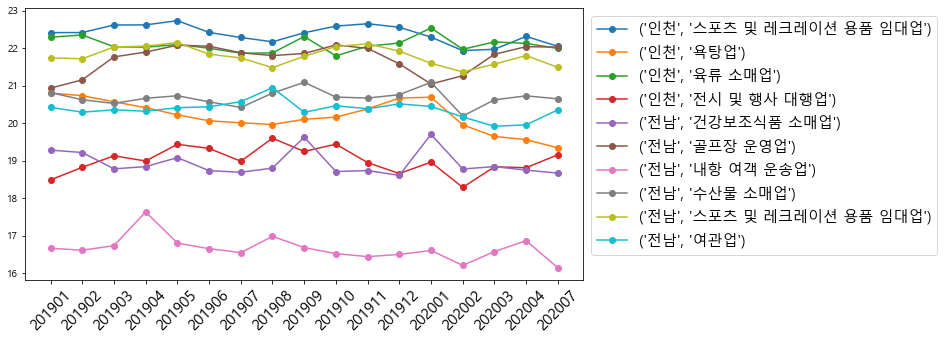

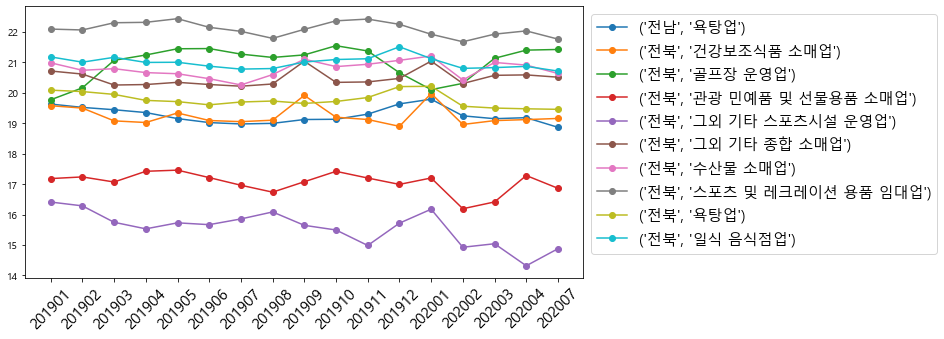

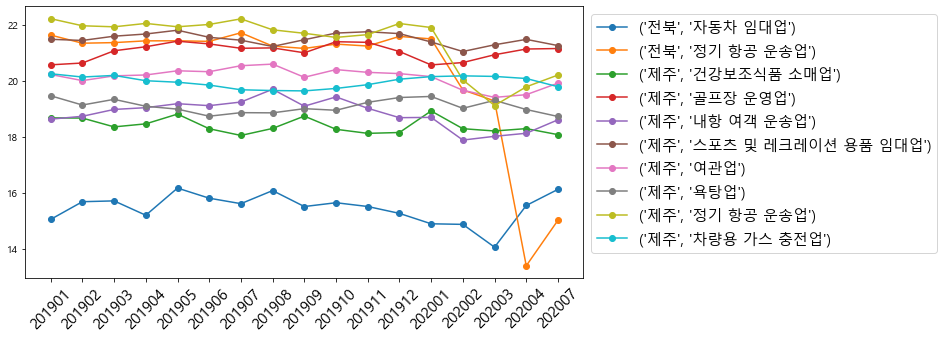

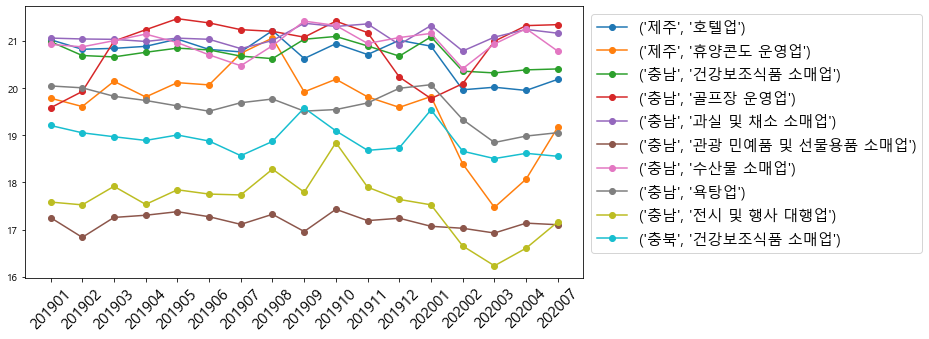

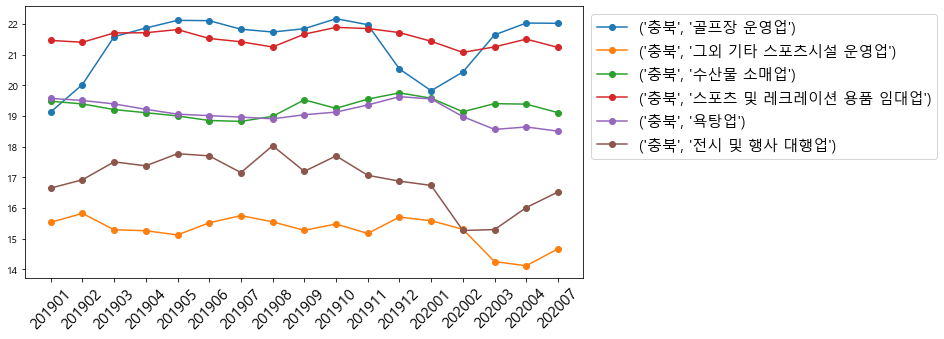

In [50]:
plot_multi_group(group_dic[2], cov_7 = True)

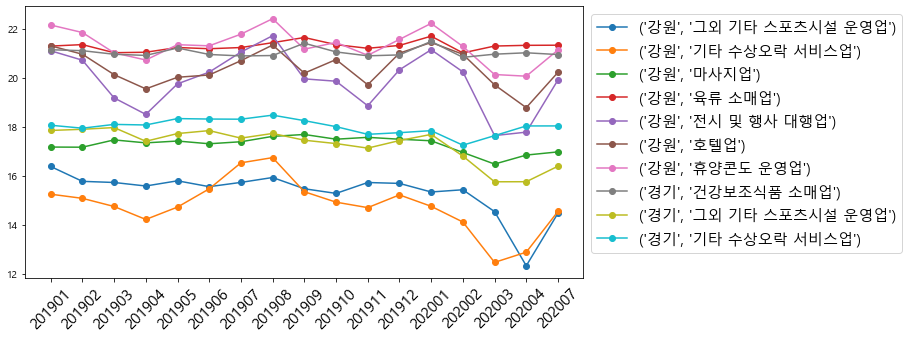

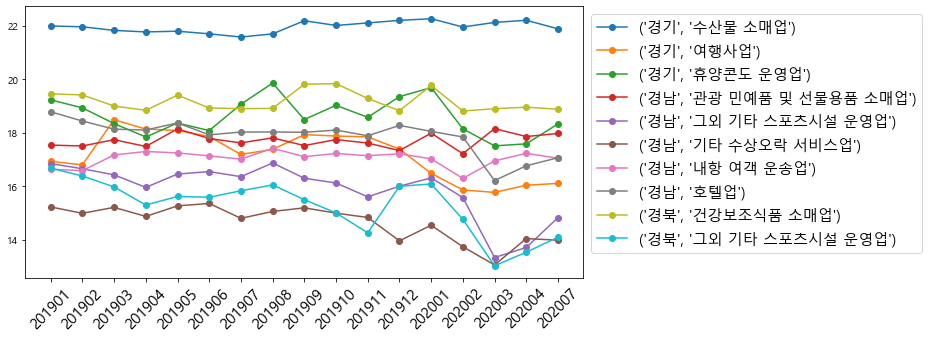

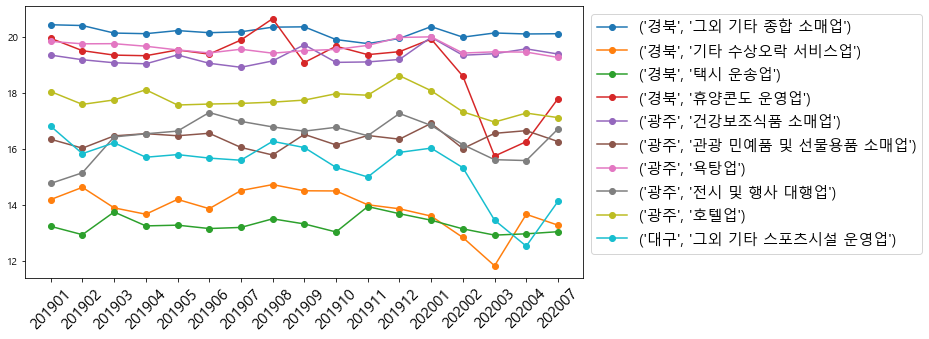

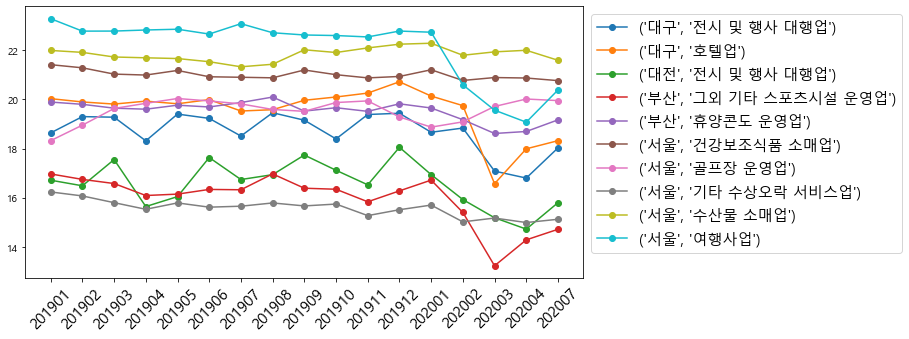

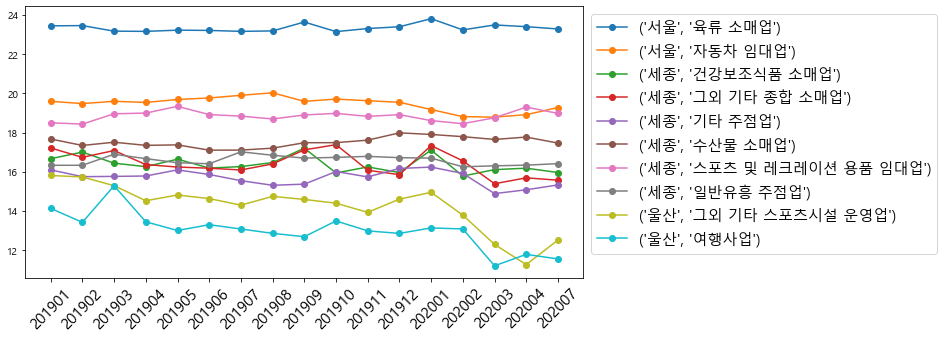

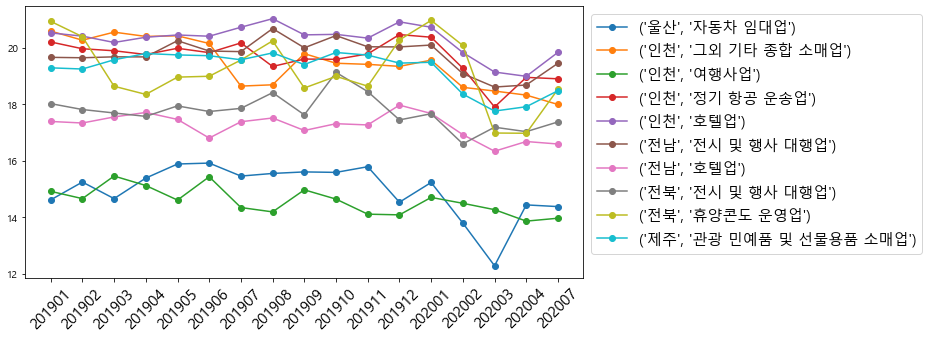

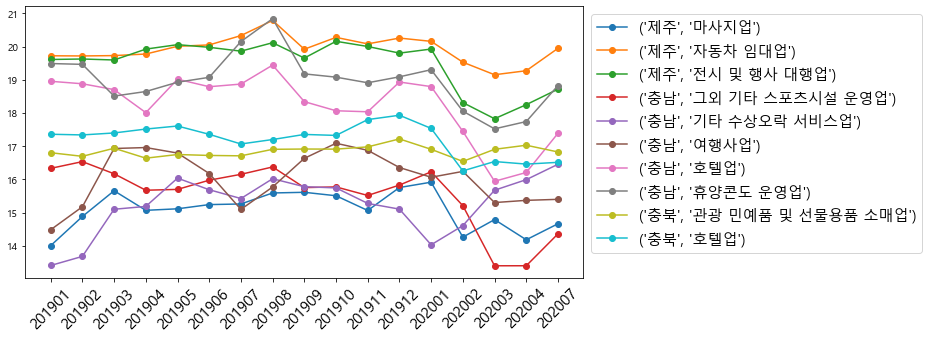

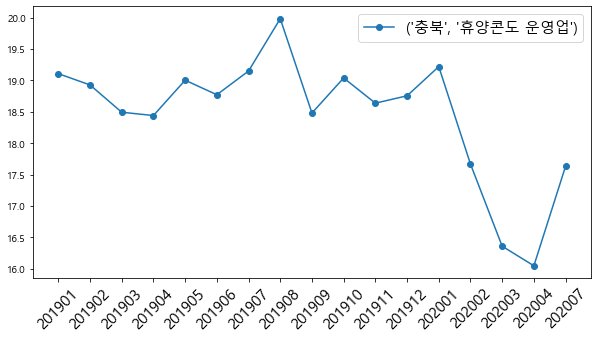

In [51]:
plot_multi_group(group_dic[3], cov_7 = True)

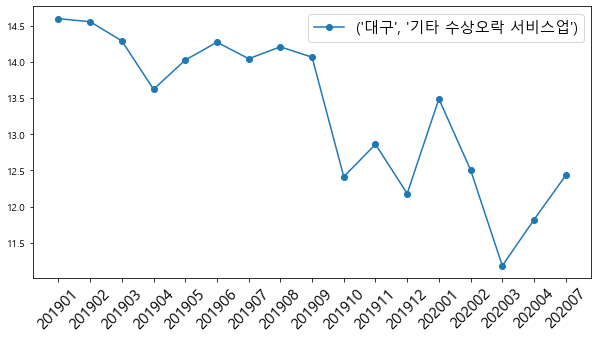

In [52]:
plot_multi_group(group_dic[4], cov_7 = True)

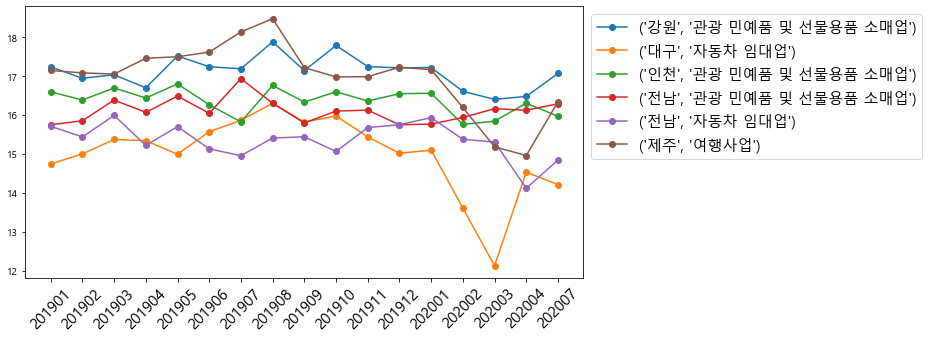

In [39]:
plot_multi_group(group_dic[5], cov_7 = True)

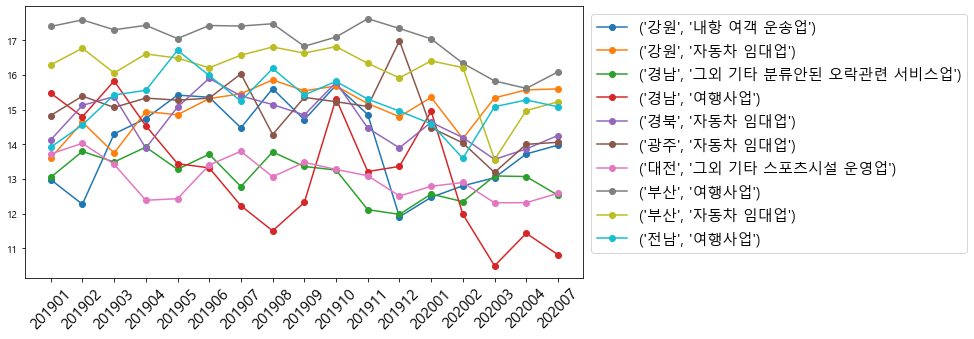

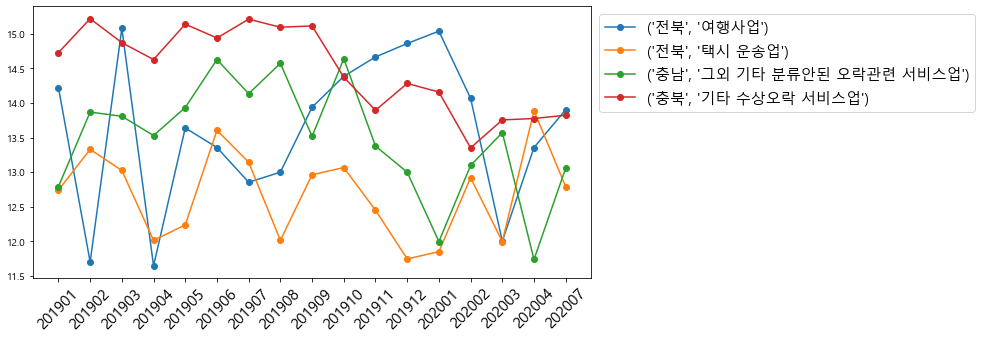

In [40]:
plot_multi_group(group_dic[6], cov_7 = True)

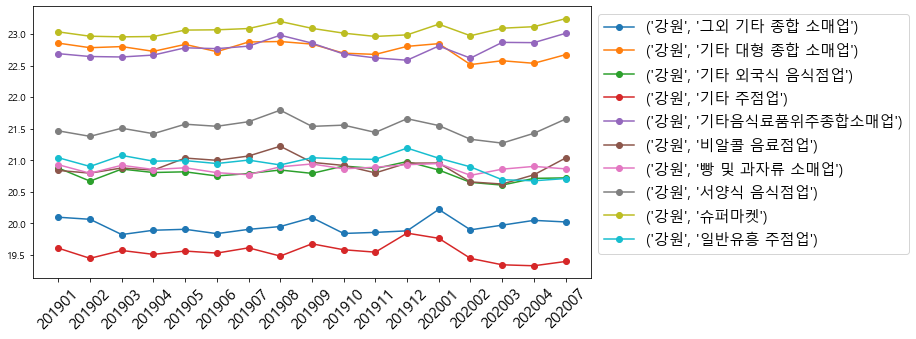

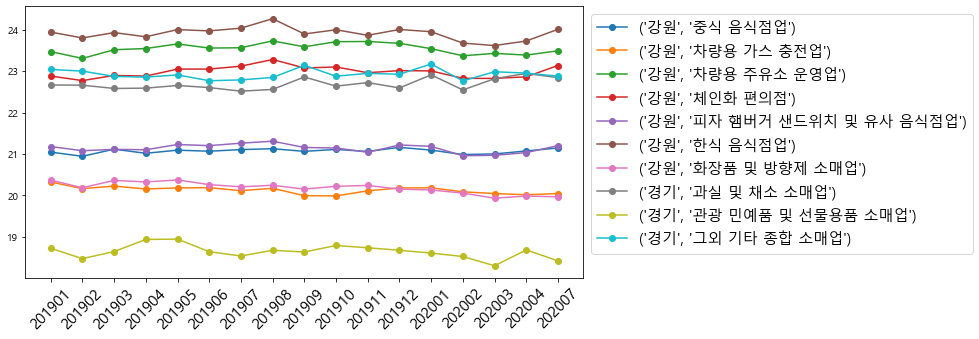

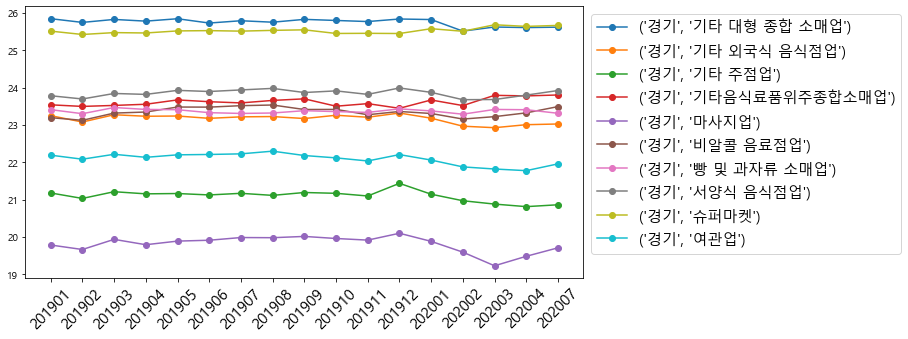

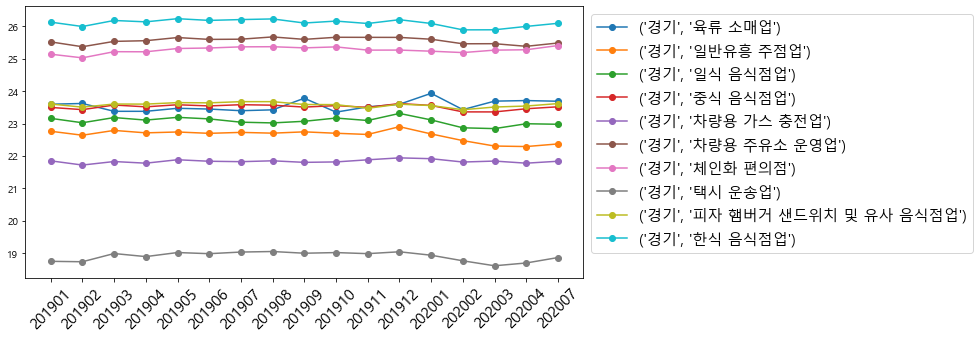

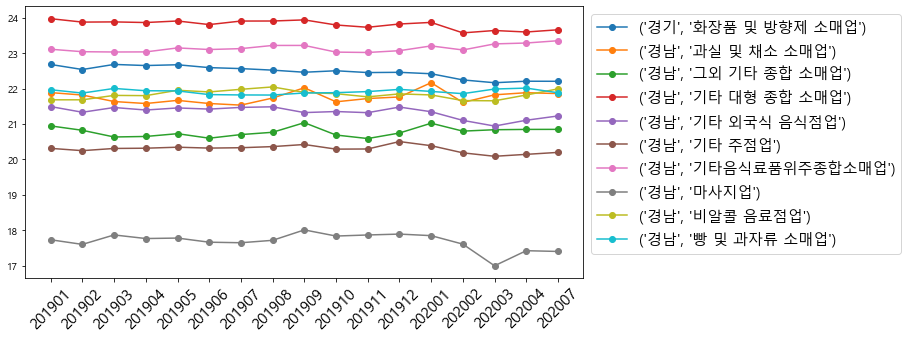

...

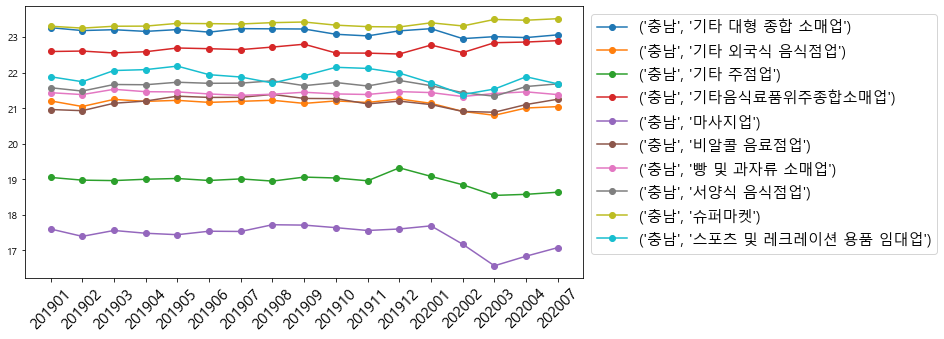

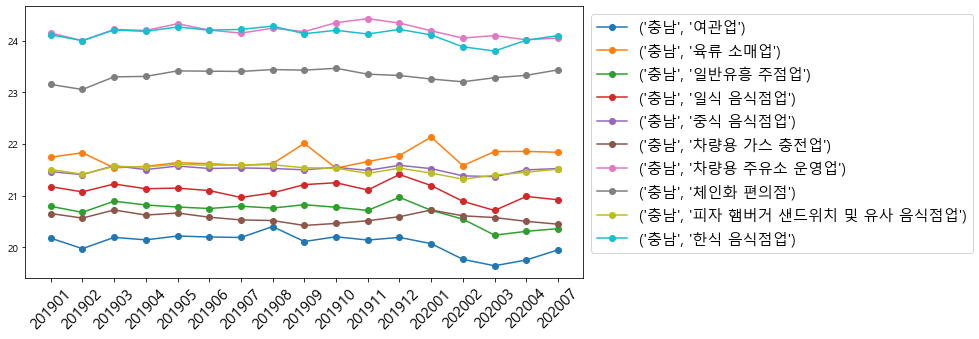

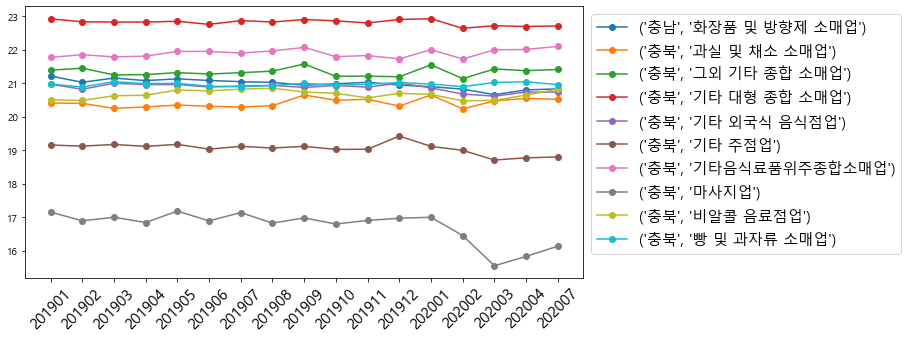

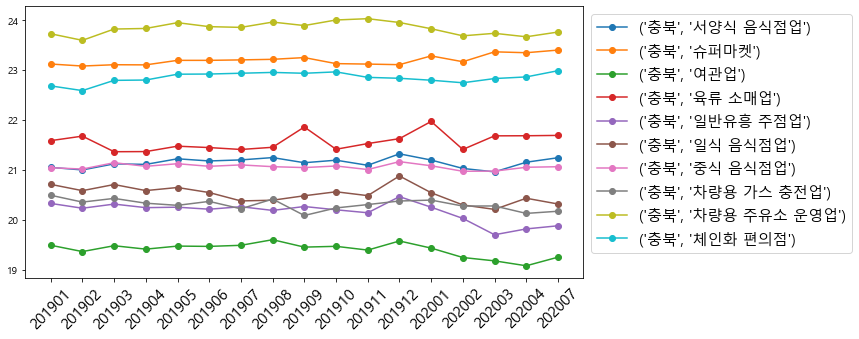

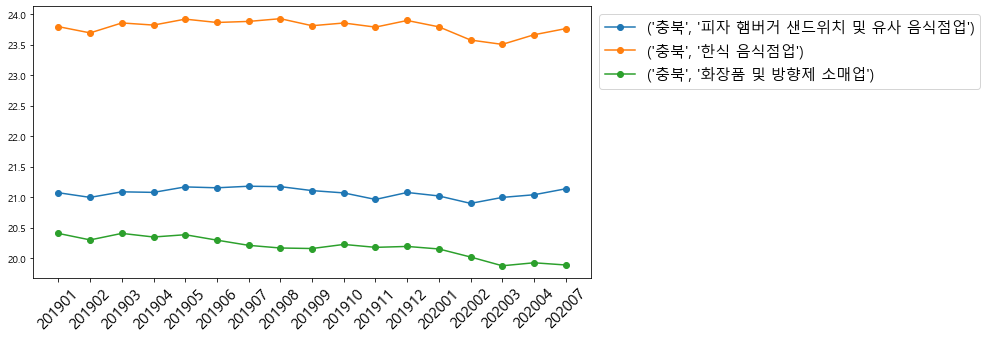

In [41]:
plot_multi_group(group_dic[7], cov_7 = True)

C:\Users\user\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:56: RuntimeWarning: divide by zero encountered in log


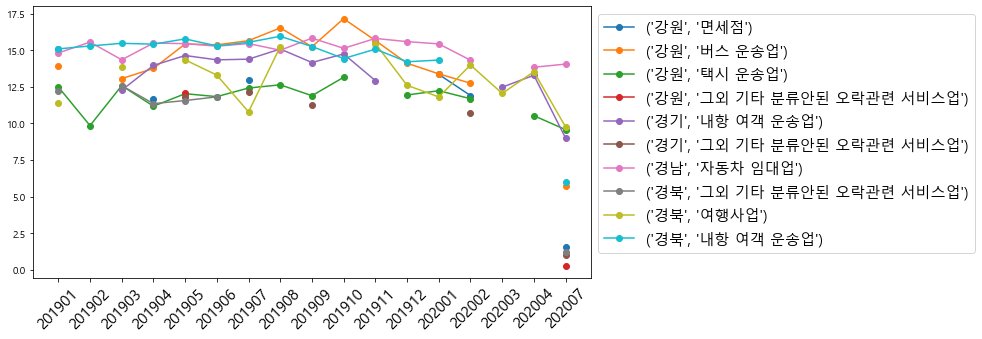

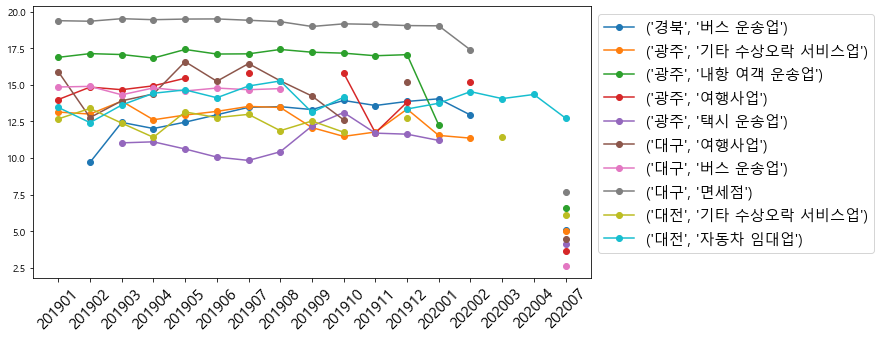

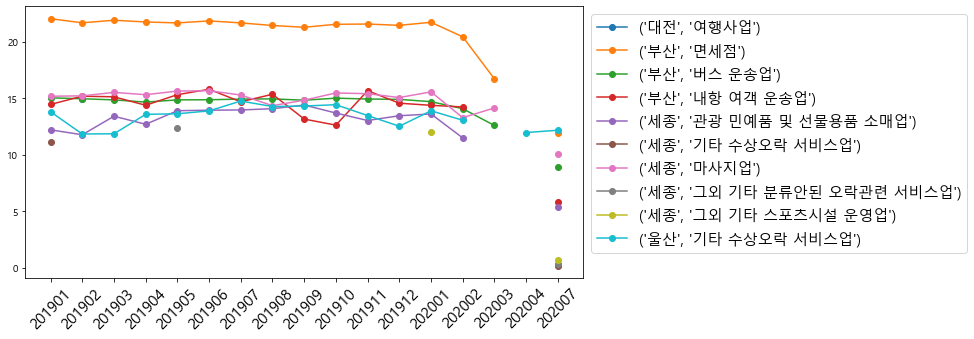

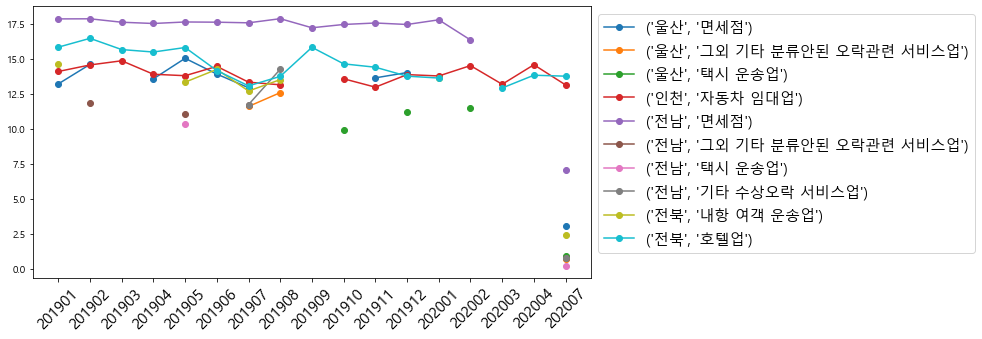

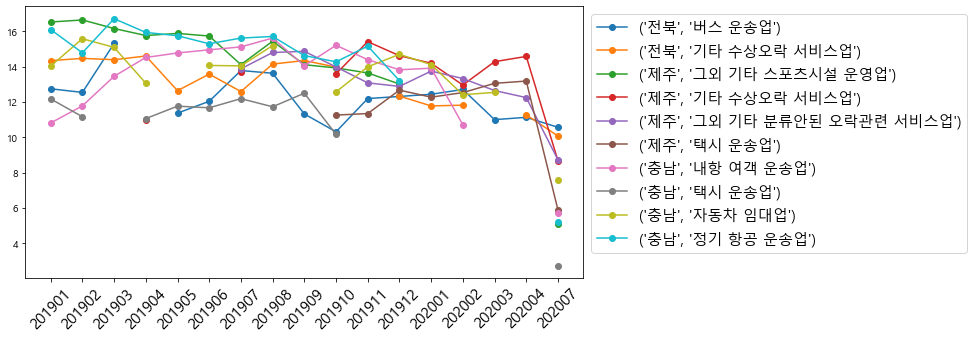

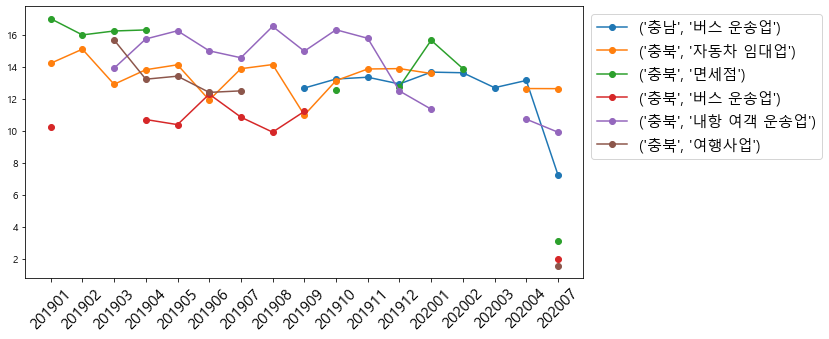

In [95]:
plot_multi_group(group_dic[8], cov_7 = True)

In [102]:
jeju_clss = list(group_city_clss.loc['제주'].index)
jeju_group = []
for clss in jeju_clss:
    jeju_group.append(['제주', clss])

C:\Users\user\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:56: RuntimeWarning: divide by zero encountered in log


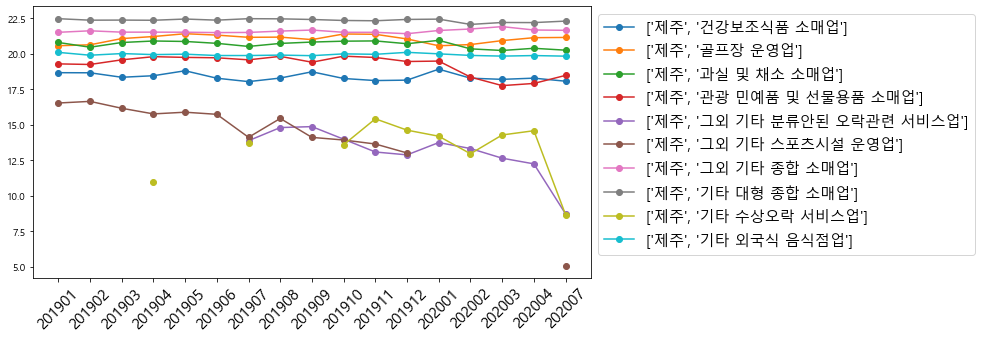

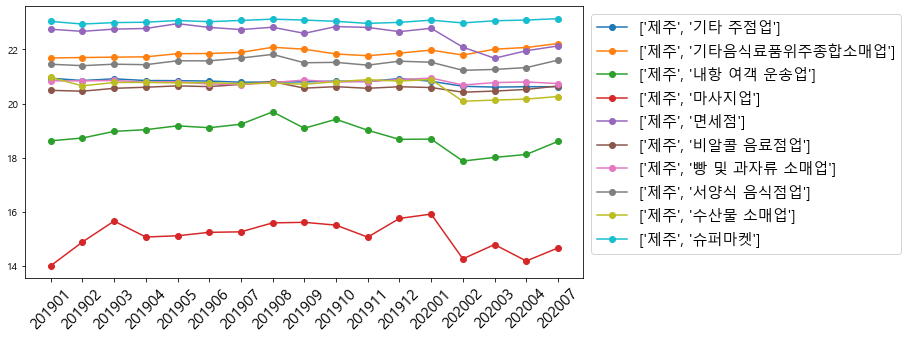

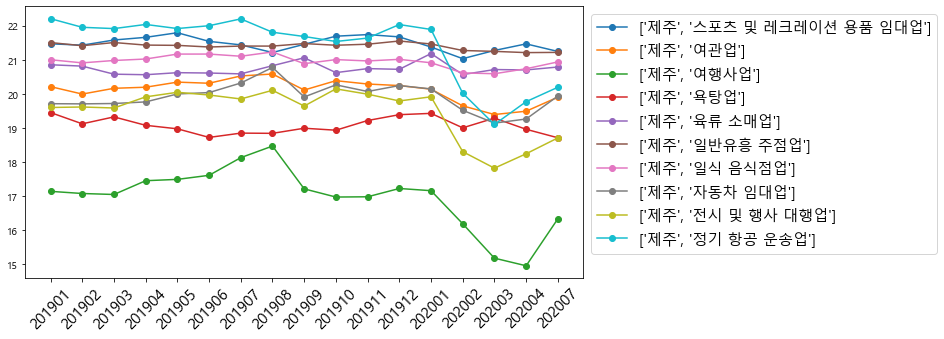

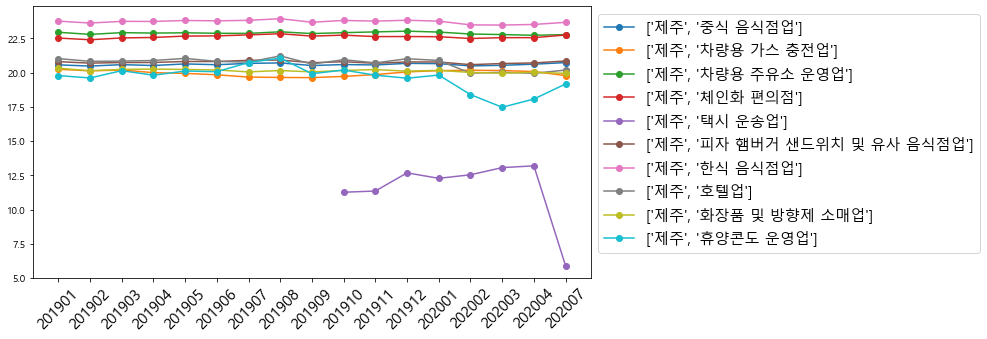

<Figure size 720x360 with 0 Axes>

In [104]:
plot_multi_group(jeju_group, cov_7 = True)

경남 버스 운송업 : 4월  
충북 택시 운송업 : 4월  
충남, 버스 운송업,4월  
부산, 면세점, 5로 처리  
제주, 택시 운송업 : 올해 4월로 사용  
제주, 그외 기타 분류안된 오락관련 서비스업  : 4월 사용  
부산, 면세점 : 3월 / 3  

In [105]:
group_city_clss = group_city_clss.rename({202007 : 'COV7'}, axis = 1)
group_city_clss = group_city_clss.reset_index()

In [106]:
group_city_clss.loc[group_city_clss.CARD_SIDO_NM , group_city_clss.CARD_SIDO_NM]

,CARD_SIDO_NM,STD_CLSS_NM,sido_clss_rows_under,total_rows,p,std_error,diff_per,rmse,r2_rate,non_cov_7,cov_ratio,COV7
0,강원,건강보조식품 소매업,449,1550,0.289677,0.237975,2.560306,0.229872,0.000811,18.384572,0.992125,18.239801
1,강원,골프장 운영업,9417,34099,0.276166,0.614788,2.577622,0.228864,0.006120,22.425919,1.006221,22.565428
2,강원,과실 및 채소 소매업,10402,28717,0.362224,0.155196,4.111683,0.111664,0.157813,20.816435,1.011819,21.062469
3,강원,관광 민예품 및 선물용품 소매업,2614,4565,0.572618,0.318397,3.637204,0.233183,0.123572,17.395585,0.981254,17.069491
4,강원,그외 기타 분류안된 오락관련 서비스업,2,2,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.697457,0.400000,0.278983
...,...,...,...,...,...,...,...,...,...,...,...,...
645,충북,피자 햄버거 샌드위치 및 유사 음식점업,12386,37711,0.328445,0.065237,-1.000000,-1.000000,-1.000000,21.169673,0.998520,21.138338
646,충북,한식 음식점업,45582,215298,0.211716,0.062572,-1.000000,-1.000000,-1.000000,23.890917,0.994671,23.763609
647,충북,호텔업,649,1335,0.486142,0.232293,48.834009,0.144811,0.161403,17.309684,0.954149,16.516016
648,충북,화장품 및 방향제 소매업,1482,7866,0.188406,0.091612,-1.000000,-1.000000,-1.000000,20.225348,0.983396,19.889524


In [129]:
group_city_clss.loc[:,'COV7'] = np.exp(group_city_clss.COV7)
group_city_clss

,CARD_SIDO_NM,STD_CLSS_NM,sido_clss_rows_under,total_rows,p,std_error,diff_per,rmse,r2_rate,non_cov_7,cov_ratio,COV7
0,강원,건강보조식품 소매업,449.0,1550.0,0.289677,0.237975,2.560306,0.229872,0.000811,18.384572,0.992618,8.421211e+07
1,강원,골프장 운영업,9417.0,34099.0,0.276166,0.614788,2.577622,0.228864,0.006120,22.425919,1.005832,6.255387e+09
2,강원,과실 및 채소 소매업,10402.0,28717.0,0.362224,0.155196,4.111683,0.111664,0.157813,20.816435,1.011081,1.382407e+09
3,강원,관광 민예품 및 선물용품 소매업,2614.0,4565.0,0.572618,0.318397,3.637204,0.233183,0.123572,17.395585,0.984379,2.733942e+07
4,강원,그외 기타 분류안된 오락관련 서비스업,2.0,2.0,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.929531,0.500000,1.591641e+00
...,...,...,...,...,...,...,...,...,...,...,...,...
645,충북,피자 햄버거 샌드위치 및 유사 음식점업,12386.0,37711.0,0.328445,0.065237,-1.000000,-1.000000,-1.000000,21.169673,0.998612,1.517450e+09
646,충북,한식 음식점업,45582.0,215298.0,0.211716,0.062572,-1.000000,-1.000000,-1.000000,23.890917,0.995004,2.107948e+10
647,충북,호텔업,649.0,1335.0,0.486142,0.232293,48.834009,0.144811,0.161403,17.309684,0.961791,1.699270e+07
648,충북,화장품 및 방향제 소매업,1482.0,7866.0,0.188406,0.091612,-1.000000,-1.000000,-1.000000,20.225348,0.984434,4.436352e+08


In [146]:
submission_layout = pd.read_csv('C:/Users/user/Desktop/DACON/jeju_credit_card/submission.csv', index_col=0)
submission_layout = submission_layout.merge(group_city_clss.loc[:,['CARD_SIDO_NM', 'STD_CLSS_NM', 'COV7']],
                              left_on=['CARD_SIDO_NM', 'STD_CLSS_NM'],
                              right_on=['CARD_SIDO_NM', 'STD_CLSS_NM'],
                              how='left')
submission_layout = submission_layout.fillna(0)

submission_layout.loc[submission_layout.REG_YYMM == 202007,'AMT'] = \
                                    submission_layout.COV7
submission_layout = submission_layout.drop('COV7', axis = 1)
submission_layout

,REG_YYMM,CARD_SIDO_NM,STD_CLSS_NM,AMT
0,202004,강원,건강보조식품 소매업,0.000000e+00
1,202004,강원,골프장 운영업,0.000000e+00
2,202004,강원,과실 및 채소 소매업,0.000000e+00
3,202004,강원,관광 민예품 및 선물용품 소매업,0.000000e+00
4,202004,강원,그외 기타 분류안된 오락관련 서비스업,0.000000e+00
...,...,...,...,...
1389,202007,충북,피자 햄버거 샌드위치 및 유사 음식점업,1.517450e+09
1390,202007,충북,한식 음식점업,2.107948e+10
1391,202007,충북,호텔업,1.699270e+07
1392,202007,충북,화장품 및 방향제 소매업,4.436352e+08


In [147]:
df_new_data = new_data.loc[:, ['REG_YYMM', 'CARD_SIDO_NM', 'STD_CLSS_NM', 'AMT']]\
                           .groupby(['CARD_SIDO_NM', 'STD_CLSS_NM', 'REG_YYMM'])['AMT']\
                           .sum()
df_new_data = pd.DataFrame(df_new_data)
df_new_data = df_new_data.reset_index()
df_new_data

,CARD_SIDO_NM,STD_CLSS_NM,REG_YYMM,AMT
0,강원,건강보조식품 소매업,202004,88823988
1,강원,골프장 운영업,202004,4708346820
2,강원,과실 및 채소 소매업,202004,1121028924
3,강원,관광 민예품 및 선물용품 소매업,202004,14360780
4,강원,그외 기타 스포츠시설 운영업,202004,227200
...,...,...,...,...
605,충북,피자 햄버거 샌드위치 및 유사 음식점업,202004,1373635928
606,충북,한식 음식점업,202004,18911036160
607,충북,호텔업,202004,14121500
608,충북,화장품 및 방향제 소매업,202004,450507431


In [148]:
submission_layout = submission_layout.merge(df_new_data.loc[submission_layout.REG_YYMM == 202004,
                                                            ['CARD_SIDO_NM', 'STD_CLSS_NM', 'AMT']],
                              left_on=['CARD_SIDO_NM', 'STD_CLSS_NM'],
                              right_on=['CARD_SIDO_NM', 'STD_CLSS_NM'],
                              how='left')
submission_layout = submission_layout.fillna(0)
submission_layout

submission_layout.loc[submission_layout.REG_YYMM == 202004,'AMT_x'] = \
                                                submission_layout.loc[submission_layout.REG_YYMM == 202004,'AMT_y']
submission_layout = submission_layout.drop('AMT_y', axis = 1)
submission_layout = submission_layout.rename({'AMT_x':'AMT'}, axis = 1)
submission_layout

,REG_YYMM,CARD_SIDO_NM,STD_CLSS_NM,AMT
0,202004,강원,건강보조식품 소매업,8.882399e+07
1,202004,강원,골프장 운영업,4.708347e+09
2,202004,강원,과실 및 채소 소매업,1.121029e+09
3,202004,강원,관광 민예품 및 선물용품 소매업,1.436078e+07
4,202004,강원,그외 기타 분류안된 오락관련 서비스업,0.000000e+00
...,...,...,...,...
1389,202007,충북,피자 햄버거 샌드위치 및 유사 음식점업,1.517450e+09
1390,202007,충북,한식 음식점업,2.107948e+10
1391,202007,충북,호텔업,1.699270e+07
1392,202007,충북,화장품 및 방향제 소매업,4.436352e+08


In [149]:
submission_layout[(submission_layout.CARD_SIDO_NM == '강원')&(submission_layout.STD_CLSS_NM == '그외 기타 분류안된 오락관련 서비스업')]

,REG_YYMM,CARD_SIDO_NM,STD_CLSS_NM,AMT
4,202004,강원,그외 기타 분류안된 오락관련 서비스업,0.000000
701,202007,강원,그외 기타 분류안된 오락관련 서비스업,1.591641


In [150]:
submission_1 = pd.read_csv('C:/Users/user/Desktop/DACON/jeju_credit_card/mul_c_3th_submission.csv', index_col=0)

<BarContainer object of 697 artists>

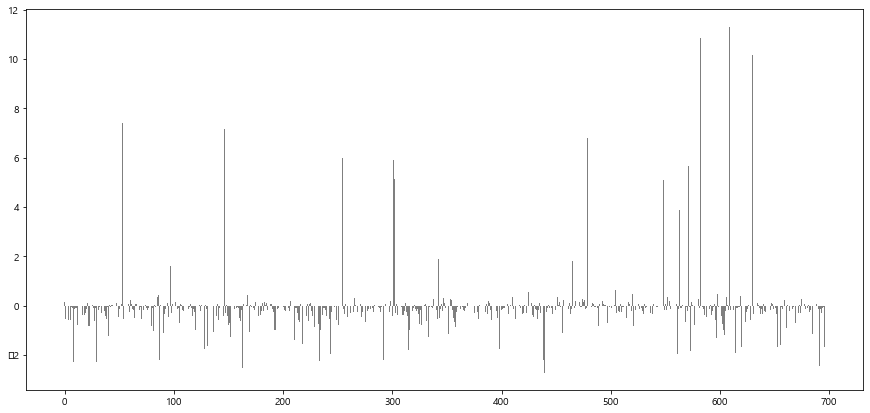

In [159]:
plt.figure(figsize = (15,7))
difference = np.log(submission_1.iloc[int(len(submission_1) / 2):,-1]) - np.log(submission_layout.iloc[int(len(submission_layout) / 2):,-1])
plt.bar(np.arange(len(submission_1)/2), difference,
        alpha = 0.5,
        color = 'black')
#plt.bar(np.arange(len(submission)/2), np.log(submission.iloc[:int(len(submission) / 2),-1]), alpha = 0.5, color = 'blue')

In [162]:
difference

id
697     0.145487
698    -0.527363
699    -0.308961
700    -0.579760
701         -inf
          ...   
1389   -0.118903
1390   -0.286535
1391   -0.088495
1392   -0.051694
1393   -1.674735
Name: AMT, Length: 697, dtype: float64

In [163]:
dif_index = []
for i, diff in enumerate(difference):
    if (diff > 4):
        dif_index.append(i)
    else:
        pass
dif_index

[53, 146, 254, 274, 301, 302, 382, 479, 548, 571, 578, 582, 609, 630, 643]

In [168]:
 index = list(np.array(dif_index) + 697)

In [170]:
submission_layout.iloc[dif_index,:]

,REG_YYMM,CARD_SIDO_NM,STD_CLSS_NM,AMT
53,202004,경기,내항 여객 운송업,589500.0
146,202004,경북,여행사업,750000.0
254,202004,대전,기타 수상오락 서비스업,0.0
274,202004,대전,자동차 임대업,1693950.0
301,202004,부산,면세점,0.0
302,202004,부산,버스 운송업,0.0
382,202004,세종,마사지업,0.0
479,202004,인천,자동차 임대업,2158600.0
548,202004,전북,버스 운송업,68800.0
571,202004,전북,호텔업,1021700.0


In [169]:
submission_layout.iloc[index,:]

,REG_YYMM,CARD_SIDO_NM,STD_CLSS_NM,AMT
750,202007,경기,내항 여객 운송업,204.805911
843,202007,경북,여행사업,139.937874
951,202007,대전,기타 수상오락 서비스업,239.192662
971,202007,대전,자동차 임대업,743.424028
998,202007,부산,면세점,50162.474062
999,202007,부산,버스 운송업,1701.695833
1079,202007,세종,마사지업,2024.595978
1176,202007,인천,자동차 임대업,652.967097
1245,202007,전북,버스 운송업,373.736733
1268,202007,전북,호텔업,1479.291329


In [156]:
submission_1.iloc[dif_index,:]

,REG_YYMM,CARD_SIDO_NM,STD_CLSS_NM,AMT
id,,,,
254,202004,대전,기타 수상오락 서비스업,9.409416e+04
301,202004,부산,면세점,1.840464e+07
302,202004,부산,버스 운송업,2.944180e+05
342,202004,서울,면세점,3.641348e+07
382,202004,세종,마사지업,1.302083e+06
563,202004,전북,정기 항공 운송업,2.348325e+08
643,202004,충남,자동차 임대업,3.091908e+05


In [186]:
submit_path = 'C:/Users/user/Desktop/DACON/jeju_credit_card/submission.csv'
submission = pd.read_csv(submit_path, index_col=0)
submission.AMT = submission_layout.AMT

In [185]:
submission.to_csv(path +'last_submission_hand.csv', encoding='utf-8-sig')
submission

,REG_YYMM,CARD_SIDO_NM,STD_CLSS_NM,AMT
id,,,,
0,202004,강원,건강보조식품 소매업,8.882399e+07
1,202004,강원,골프장 운영업,4.708347e+09
2,202004,강원,과실 및 채소 소매업,1.121029e+09
3,202004,강원,관광 민예품 및 선물용품 소매업,1.436078e+07
4,202004,강원,그외 기타 분류안된 오락관련 서비스업,0.000000e+00
...,...,...,...,...
1389,202007,충북,피자 햄버거 샌드위치 및 유사 음식점업,1.517450e+09
1390,202007,충북,한식 음식점업,2.107948e+10
1391,202007,충북,호텔업,1.699270e+07
